In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import re
from tqdm import tqdm
from itertools import product
from collections import Counter,defaultdict
from sklearn.model_selection import train_test_split, GroupKFold,StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score, f1_score
from sklearn.model_selection import GridSearchCV 
import lightgbm
from lightgbm import LGBMClassifier
import xgboost
from xgboost import plot_importance
from scipy.sparse import coo_matrix, vstack
import scipy
import pickle
import statistics
import random
import itertools
import matplotlib.ticker as ticker
from matplotlib.legend import Legend

from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.metrics import roc_auc_score, precision_score, recall_score
from sklearn import preprocessing
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from Bio import SeqIO

import seaborn as sns
sns.set_theme()

/home/parazit/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.25.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
'''
PATH_SAMPLE_IDS = 'D://host_predicition//v2.0//sample_ids//'
PATH_REPORTS = 'D://host_predicition//v2.0//Reports//'
PATH_DATA = 'D://host_predicition//v2.0//data//'
PATH_FIGS = 'D://host_predicition//v2.0//figs//'
'''

PATH_FEATURES = '/home/parazit/ml_virus_host/v2.0/Features/'
PATH_SAMPLE_IDS = '/home/parazit/ml_virus_host/v2.0/sample_ids/'
PATH_DATA = '/home/parazit/ml_virus_host/v2.0/data/'
PATH_REPORTS = '/home/parazit/ml_virus_host/v2.0/Reports/'
PATH_FIGS = '/home/parazit/ml_virus_host/v2.0/figs/'
PATH_RANGED_REPORTS = '/home/parazit/ml_virus_host/v2.0/Reports/ranged/'
PATH_FASTSK_REPORTS = '/home/parazit/ml_virus_host/v2.0/fastsk/reports/'
PATH_FASTSK_DATA = '/home/parazit/ml_virus_host/v2.0/fastsk/data/'
PATH_CLASSIFICATORS = '/home/parazit/ml_virus_host/v2.0/classificators/'
PATH_REPORTS_FULL2RANGED = '/home/parazit/ml_virus_host/v2.0/Reports/full->ranged/'

In [3]:
future_sample_id_uncrossing = pickle.load(open(PATH_SAMPLE_IDS + 'uncrossing_sample.pkl', 'rb'))[0]
future_sample_id_rhab = pickle.load(open(PATH_SAMPLE_IDS + 'rhabdoviridae_sample.pkl', 'rb'))
future_sample_id_crossing = pickle.load(open(PATH_SAMPLE_IDS + 'crossing_sample.pkl', 'rb'))

In [4]:
meta_df=pd.read_csv(PATH_DATA+'data_table.tsv', sep='\t', index_col = 'refseq id')

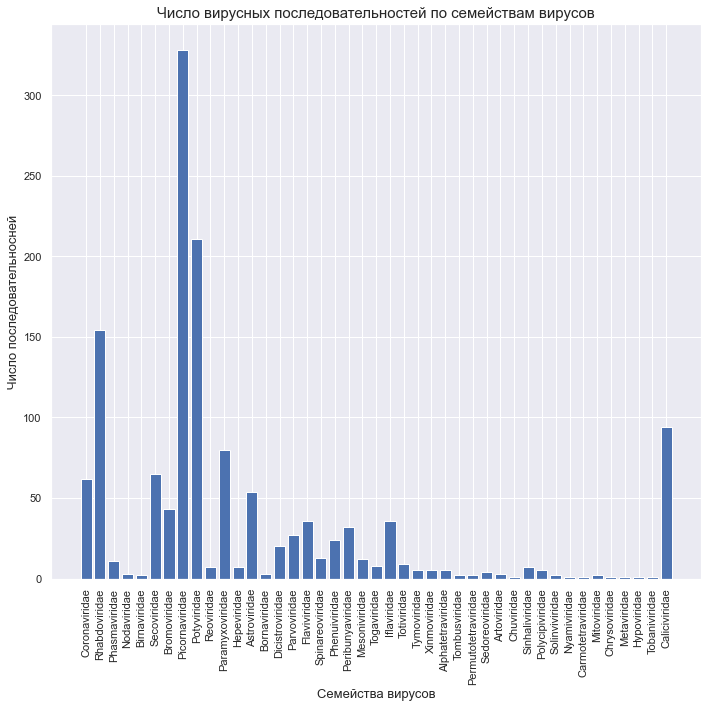

In [6]:
plt.figure(figsize=(10,10))
tmp = Counter(meta_df['virus family'])
plt.bar(range(len(tmp)), tmp.values(), tick_label=list(tmp.keys()))
plt.xticks(rotation=90, ha='center')
plt.title('Число вирусных последовательностей по семействам вирусов', fontsize=15)
plt.ylabel('Число последовательносней', fontsize=13)
plt.xlabel('Семейства вирусов', fontsize=13)
plt.tight_layout()
plt.savefig(PATH_FIGS+'families_number.png')
plt.savefig(PATH_FIGS+'families_number.svg')
plt.show()

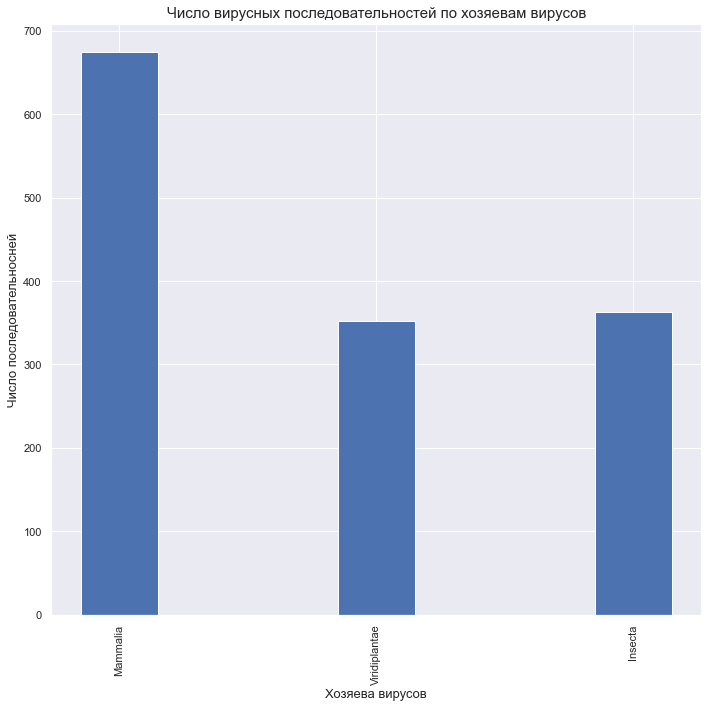

In [7]:
plt.figure(figsize=(10,10))
tmp = Counter(meta_df['host'])
plt.bar(range(len(tmp)), tmp.values(), tick_label=list(tmp.keys()), width = 0.3)
plt.xticks(rotation=90, ha='center')
plt.title('Число вирусных последовательностей по хозяевам вирусов', fontsize=15)
plt.ylabel('Число последовательносней', fontsize=13)
plt.xlabel('Хозяева вирусов', fontsize=13)
plt.tight_layout()
plt.savefig(PATH_FIGS+'hosts_number.png')
plt.savefig(PATH_FIGS+'hosts_number.svg')
plt.show()

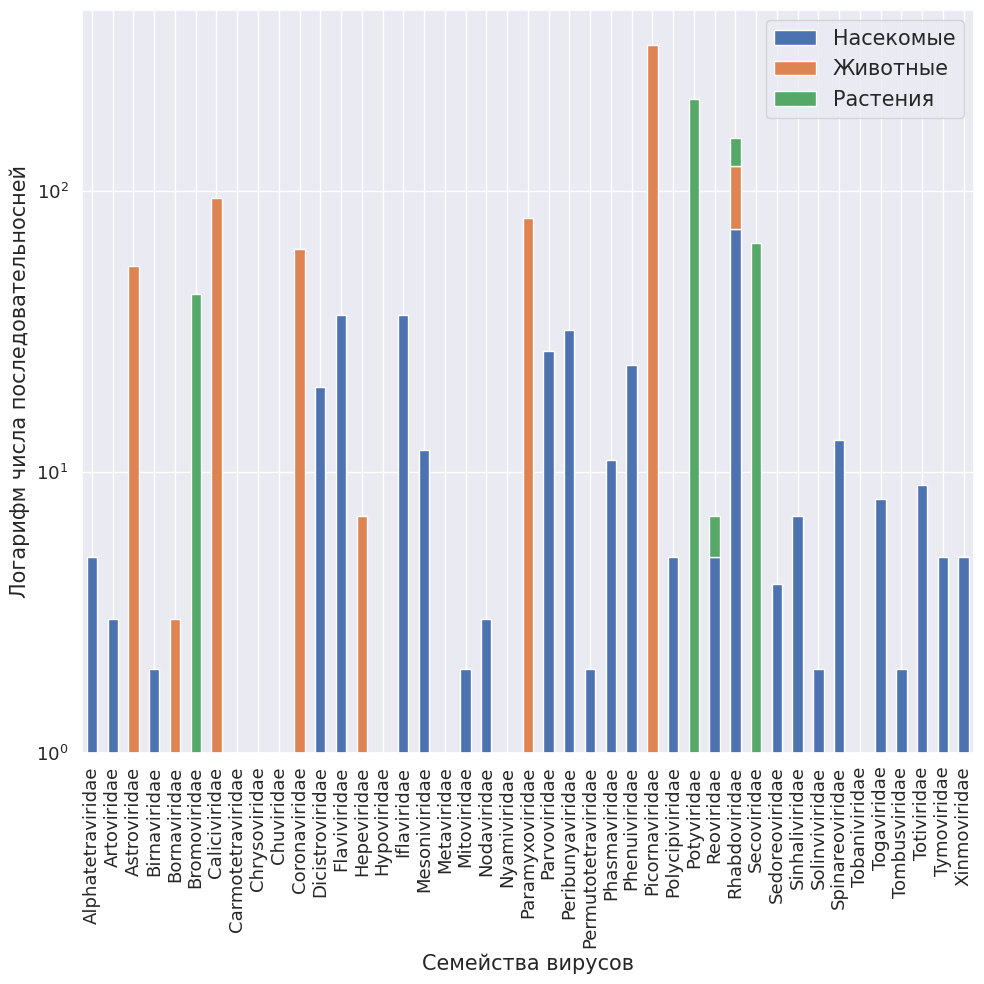

In [10]:
meta_df.groupby(['virus family', 'host']).size().unstack().plot(kind='bar', figsize=(10,10), stacked=True).legend(labels=['Насекомые', 'Животные', 'Растения'], fontsize=15)
plt.xticks(rotation=90, ha='center', fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel('Логарифм числа последовательносней', fontsize=15)
plt.xlabel('Семейства вирусов', fontsize=15)
plt.yscale("log")
#plt.title('Распределение вирусных хозяев', fontsize=15)
plt.tight_layout()
plt.savefig(PATH_FIGS+'hosts_distrib.svg')
plt.savefig(PATH_FIGS+'hosts_distrib.png')
plt.show()

In [19]:
lst_tmp1 = meta_df.loc[future_sample_id_crossing]['virus family'].unique()
lst_tmp2 = meta_df['virus family'].unique()

for el in lst_tmp2:
    if not el in lst_tmp1:
        print(el, len(meta_df[meta_df['virus family'] == el]))

Birnaviridae 2
Tombusviridae 2
Permutotetraviridae 2
Chuviridae 1
Solinviviridae 2
Nyamiviridae 1
Carmotetraviridae 1
Mitoviridae 2
Chrysoviridae 1
Metaviridae 1
Hypoviridae 1
Tobaniviridae 1


In [21]:
meta_df[meta_df['virus family'] == "Hepeviridae"]

,virus tax id,virus name,virus family,host,host name
refseq id,,,,,
AB073912,63421,Swine hepatitis E virus,Hepeviridae,Mammalia,Sus scrofa
AB593690,509628,Hepatitis E virus type 3,Hepeviridae,Mammalia,Homo sapiens
GU345043,879095,Hepatitis E virus rat/R68/DEU/2009,Hepeviridae,Mammalia,Rattus norvegicus
JN998607,1213422,Ferret hepatitis E virus,Hepeviridae,Mammalia,Mustela putorius
NC_018382,1678146,Chirohepevirus eptesici,Hepeviridae,Mammalia,Eptesicus serotinus
NC_038504,879096,Hepatitis E virus rat/R63/DEU/2009,Hepeviridae,Mammalia,Rattus norvegicus
NC_040710,2152923,Sogatella furcifera hepe-like virus,Hepeviridae,Insecta,Sogatella furcifera


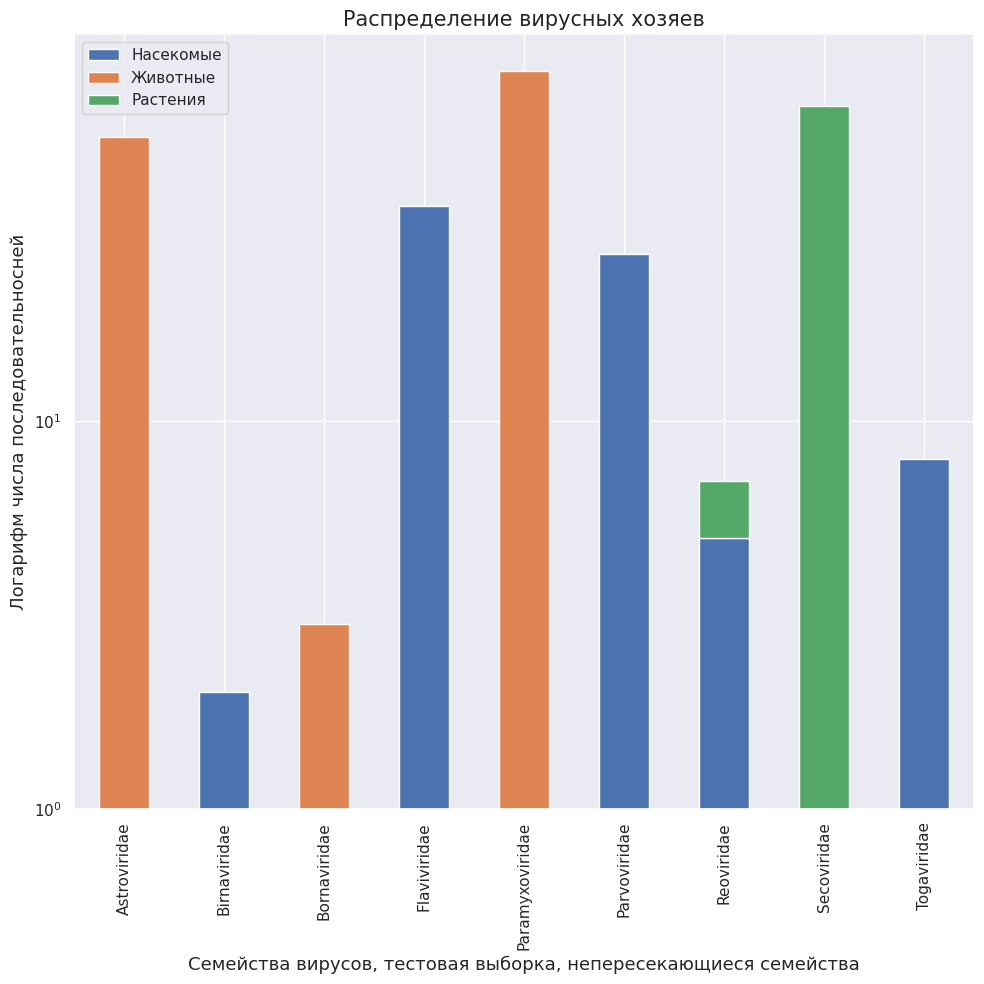

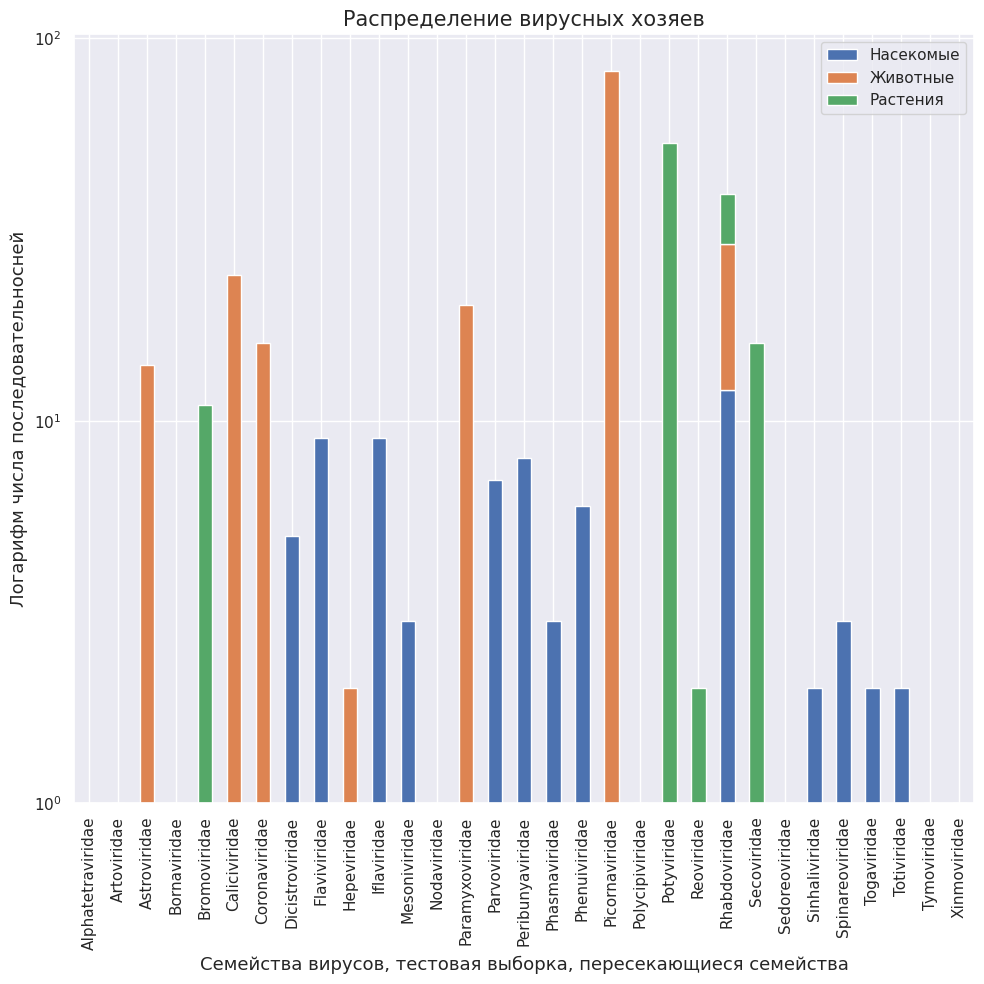

In [8]:
ids = [future_sample_id_uncrossing, future_sample_id_crossing, future_sample_id_rhab]
names = ['uncrossing', 'crossing', 'rhabdoviridae']
names_rus = ['непересекающиеся семейства', 'пересекающиеся семейства']
for i in range(2):

    tmp = meta_df.loc[ids[i]]
    tmp.groupby(['virus family', 'host']).size().unstack().plot(kind='bar', figsize=(10,10), stacked=True).legend(labels=['Насекомые', 'Животные', 'Растения'])
    plt.xticks(rotation=90, ha='center')
    plt.ylabel('Логарифм числа последовательносней', fontsize=13)
    plt.xlabel('Семейства вирусов, тестовая выборка, ' + names_rus[i], fontsize=13)
    plt.yscale("log")
    plt.title('Распределение вирусных хозяев', fontsize=15)
    plt.tight_layout()
    plt.savefig(PATH_FIGS+'hosts_distrib_'+names[i]+'.svg')
    plt.savefig(PATH_FIGS+'hosts_distrib_'+names[i]+'.png')
    plt.show()

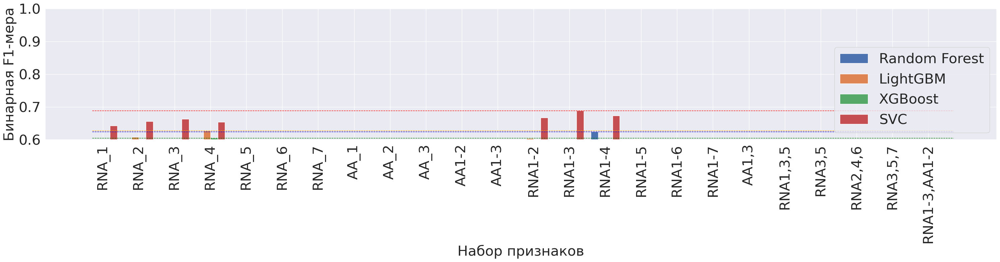

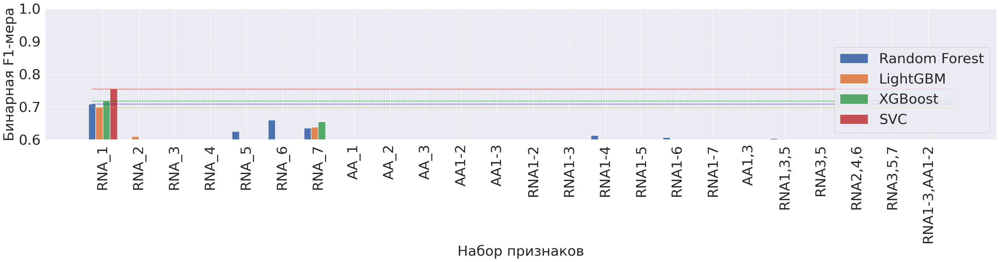

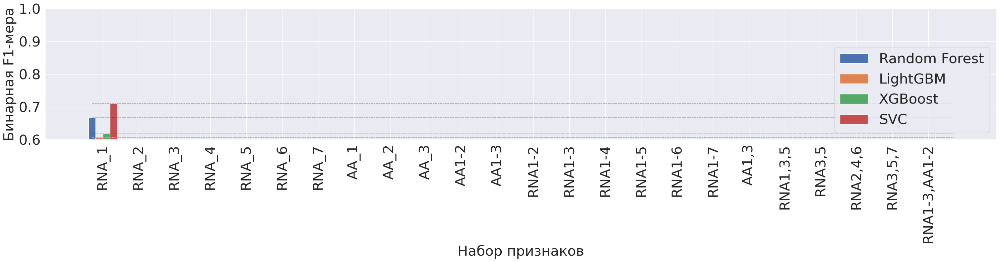

               Random Forest  LightGBM  XGBoost   SVC
Insecta                 0.62      0.63     0.60  0.69
Mammalia                0.71      0.70     0.72  0.76
Viridiplantae           0.67      0.61     0.62  0.71
              Random Forest LightGBM XGBoost     SVC
Insecta              RNA1-4    RNA_4   RNA_4  RNA1-3
Mammalia              RNA_1    RNA_1   RNA_1   RNA_1
Viridiplantae         RNA_1    RNA_1   RNA_1   RNA_1


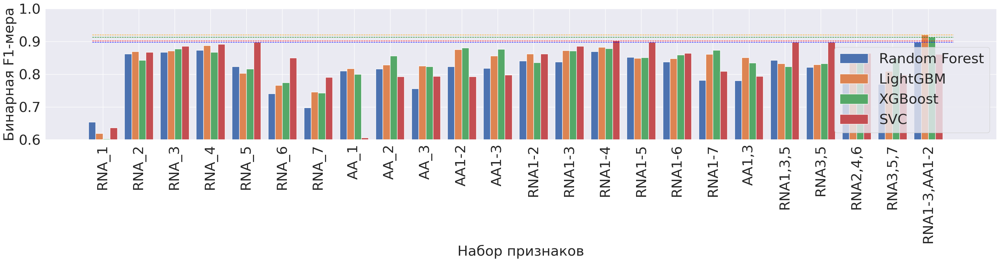

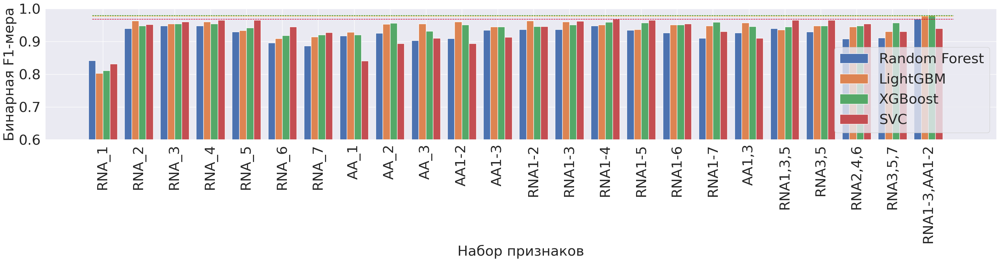

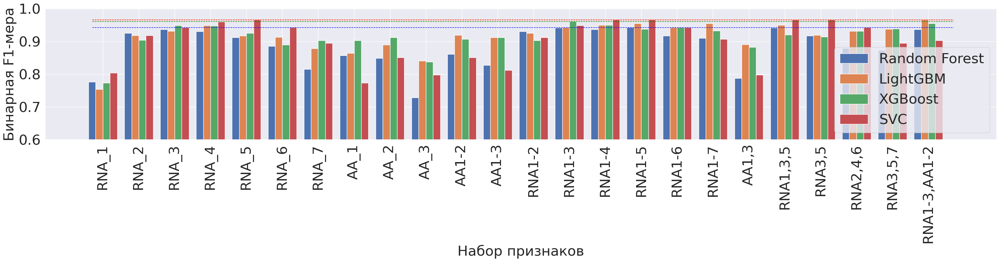

               Random Forest  LightGBM  XGBoost   SVC
Insecta                 0.90      0.92     0.91  0.90
Mammalia                0.97      0.98     0.98  0.97
Viridiplantae           0.94      0.97     0.96  0.97
              Random Forest      LightGBM       XGBoost     SVC
Insecta        RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-4
Mammalia       RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-4
Viridiplantae        RNA1-5  RNA1-3,AA1-2        RNA1-3   RNA_5


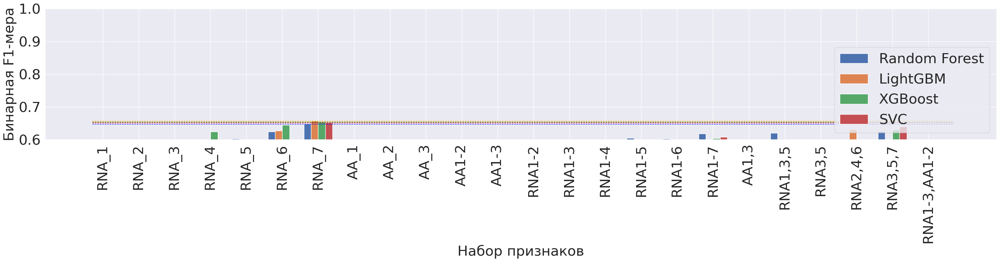

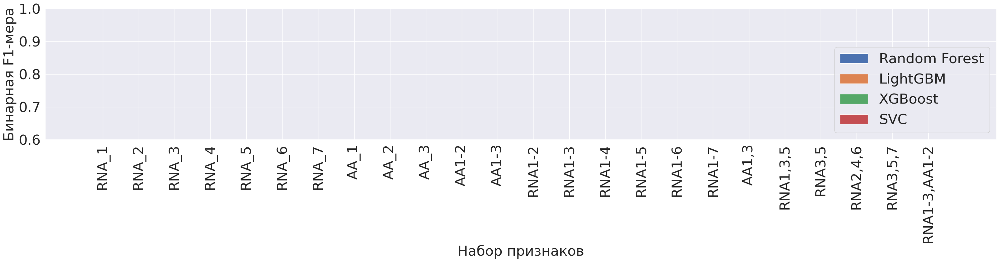

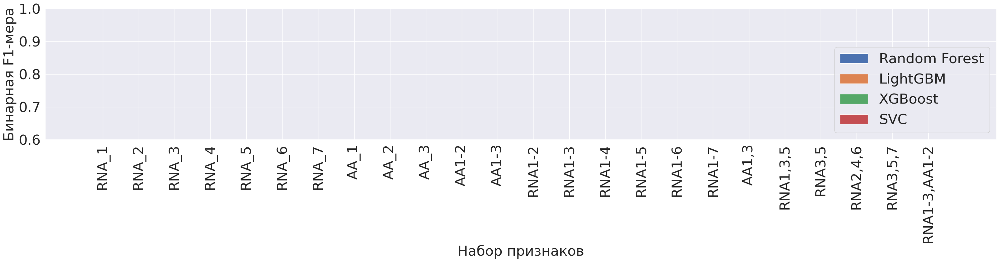

               Random Forest  LightGBM  XGBoost   SVC
Insecta                 0.65      0.66     0.65  0.65
Mammalia                0.54      0.49     0.50  0.50
Viridiplantae           0.42      0.44     0.41  0.45
              Random Forest LightGBM XGBoost       SVC
Insecta               RNA_7    RNA_7   RNA_7     RNA_7
Mammalia           RNA1,3,5    RNA_1   RNA_4  RNA3,5,7
Viridiplantae         RNA_1    RNA_1   RNA_1     RNA_1


In [5]:
bar_width = 0.2


with open(PATH_REPORTS + 'full//uncrossing//clfs_4methods_all_uncrossing.pkl', 'rb') as f1, \
    open(PATH_REPORTS + 'full//uncrossing//clfs_4methods_sole_uncrossing.pkl', 'rb') as f2, \
    open(PATH_REPORTS + 'full//crossing//clfs_4methods_all_crossing.pkl', 'rb') as f3, \
    open(PATH_REPORTS + 'full//crossing//clfs_4methods_sole_crossing.pkl', 'rb') as f4, \
    open(PATH_REPORTS + 'full//rhab//clfs_4methods_all_rhab.pkl', 'rb') as f5, \
    open(PATH_REPORTS + 'full//rhab//clfs_4methods_sole_rhab.pkl', 'rb') as f6:

    
    sets_names = ['uncrossing', 'crossing', 'rhabdoviridae']
    pic_headers = ['Непересекающиеся семейства вирусов', 'Пересекающиеся семейства вирусов', 'Рабдовирусы']
    f_lst = [f1, f2, f3, f4, f5, f6]
   
    for set_index in range(len(sets_names)):
        
        pair_lst = list()
        pair_lst.append(pickle.load(f_lst[set_index*2]))
        pair_lst.append(pickle.load(f_lst[set_index*2+1]))
        all_accs = {**pair_lst[1], **pair_lst[0]}

        models = ['rf', 'lgbm', 'xgb', 'svc']
        hosts = ['Insecta', 'Mammalia', 'Viridiplantae']
        hosts_rus = ['Насекомые', 'Млекопитающие', 'Растения']
        
        max_values = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])
        max_features = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])


        for class_k in hosts:
            
            fig, axis = plt.subplots(figsize=(30, 8))

            rf_values = [x[0][class_k]['f1-score'] for x in all_accs.values()]
            lgbm_values = [x[1][class_k]['f1-score'] for x in all_accs.values()]
            xgb_values = [x[2][class_k]['f1-score'] for x in all_accs.values()]
            svm_values = [x[3][class_k]['f1-score'] for x in all_accs.values()]

            accs = [rf_values, lgbm_values, xgb_values, svm_values]
            
            max_values_row = {'Random Forest':round(max(rf_values), 2), \
                              'LightGBM':round(max(lgbm_values), 2), \
                              'XGBoost':round(max(xgb_values), 2), \
                              'SVC':round(max(svm_values), 2)}
            max_values = max_values.append(max_values_row, ignore_index=True)
            
            max_features_row = {'Random Forest':list(all_accs.keys())[rf_values.index(max(rf_values))], \
                               'LightGBM':list(all_accs.keys())[lgbm_values.index(max(lgbm_values))], \
                               'XGBoost':list(all_accs.keys())[xgb_values.index(max(xgb_values))], \
                               'SVC':list(all_accs.keys())[svm_values.index(max(svm_values))]}
            max_features = max_features.append(max_features_row, ignore_index=True)
            
            #pd.concat(max_values_row, max_values).reset_index(drop=True)
            
            axis.bar([x for x in list(range(len(all_accs.keys())))], rf_values, bar_width, align='center', label="Random Forest")
            axis.bar([x+bar_width for x in list(range(len(all_accs.keys())))], lgbm_values, bar_width, align='center', label='LightGBM')
            axis.bar([x+bar_width*2 for x in list(range(len(all_accs.keys())))], xgb_values, bar_width, align='center', label='XGBoost')
            axis.bar([x+bar_width*3 for x in list(range(len(all_accs.keys())))], svm_values, bar_width, align='center', label='SVC')
            
            plt.hlines(y=max(rf_values), xmin=0, xmax=len(all_accs.keys()), colors='blue', linestyles='--', lw=1)
            plt.hlines(y=max(lgbm_values), xmin=0, xmax=len(all_accs.keys()), colors='orange', linestyles='--', lw=1)
            plt.hlines(y=max(xgb_values), xmin=0, xmax=len(all_accs.keys()), colors='green', linestyles='--', lw=1)
            plt.hlines(y=max(svm_values), xmin=0, xmax=len(all_accs.keys()), colors='red', linestyles='--', lw=1)
            
            
            #axis.set_title(pic_headers[set_index]+', бинарный F1-score ('+hosts_rus[hosts.index(class_k)]+')', fontsize=40)
            axis.legend(fontsize=30, loc='lower right')
            
            axis.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
            
            plt.sca(axis)
            plt.xticks([x+bar_width*1.5 for x in list(range(len(all_accs.keys())))], list(all_accs.keys()), fontsize=30, rotation=90)
            axis.tick_params('y', labelsize=30)
            plt.ylim(0.6, 1)
            plt.ylabel('Бинарная F1-мера', fontsize=30)
            plt.xlabel('Набор признаков', fontsize=30)
            fig.tight_layout()
            
            plt.savefig(PATH_FIGS+'clfs_'+sets_names[set_index]+'_f1-score_'+class_k+'.svg')
            plt.savefig(PATH_FIGS+'clfs_'+sets_names[set_index]+'_f1-score_'+class_k+'.png')
            plt.show()
        
        max_features.index = hosts
        max_values.index = hosts
        print(max_values)
        print(max_features)

In [7]:
import cv2

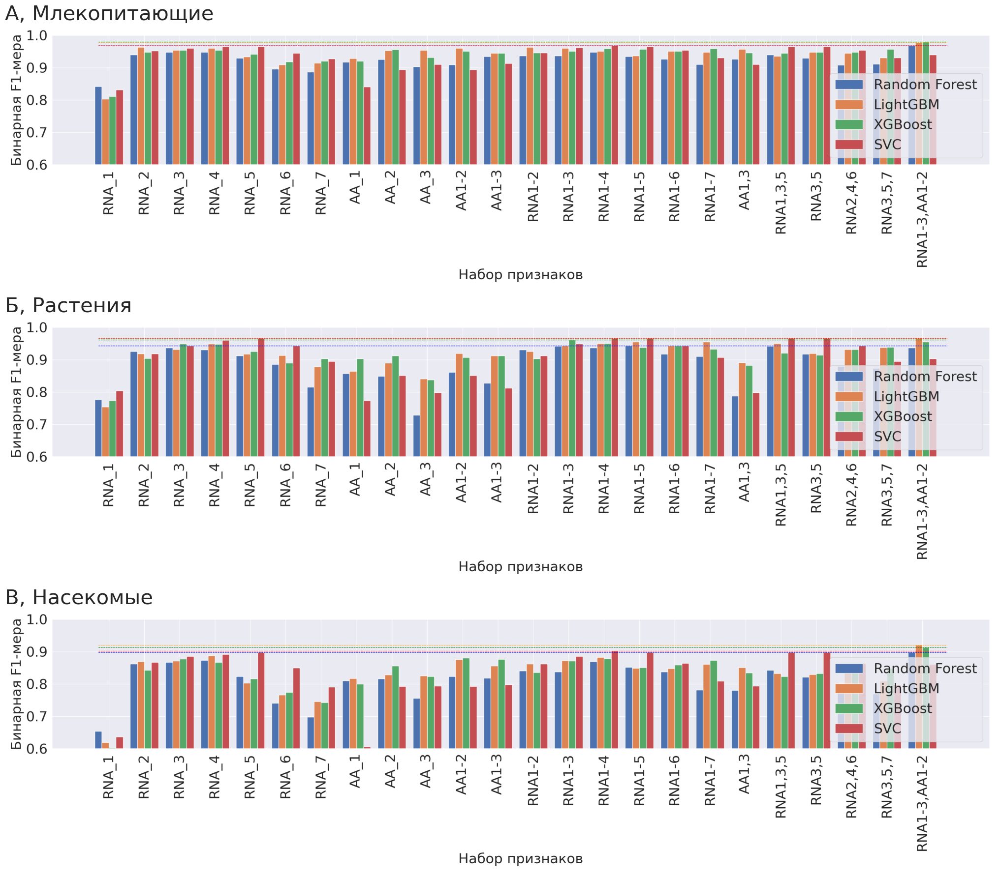

In [9]:
tmp_path = '/home/parazit/ml_virus_host/v2.0/figs/make_1_pic/'
fig = plt.figure(figsize=(26, 18))
  
rows = 3
columns = 1

insceta = cv2.imread(tmp_path+'clfs_crossing_f1-score_Insecta.png')
insceta = cv2.cvtColor(insceta, cv2.COLOR_BGR2RGB)

mammalia = cv2.imread(tmp_path+'clfs_crossing_f1-score_Mammalia.png')
mammalia = cv2.cvtColor(mammalia, cv2.COLOR_BGR2RGB)

viridiplantae = cv2.imread(tmp_path+'clfs_crossing_f1-score_Viridiplantae.png')
viridiplantae = cv2.cvtColor(viridiplantae, cv2.COLOR_BGR2RGB)
 

fig.add_subplot(rows, columns, 1)
plt.imshow(mammalia)
plt.axis('off')
plt.title("А, Млекопитающие", fontsize = 30, loc='left')

fig.add_subplot(rows, columns, 2)
plt.imshow(viridiplantae)
plt.axis('off')
plt.title("Б, Растения", fontsize = 30, loc='left')

fig.add_subplot(rows, columns, 3)
plt.imshow(insceta)
plt.axis('off')
plt.title("В, Насекомые", fontsize = 30, loc='left')

fig.tight_layout()
plt.savefig(tmp_path+'clfs_crossing_f1-score_3classes'+'.png', dpi=fig.dpi)
plt.show()

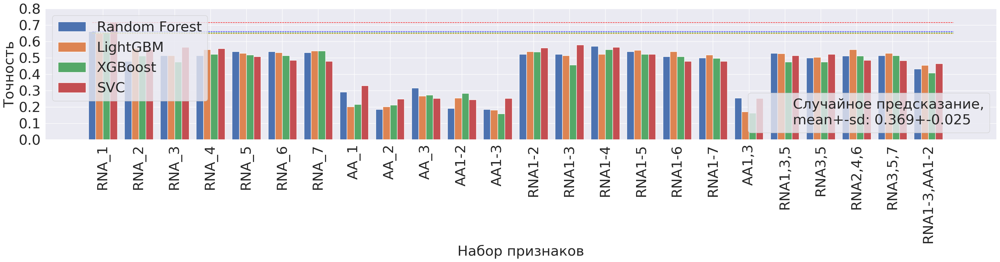

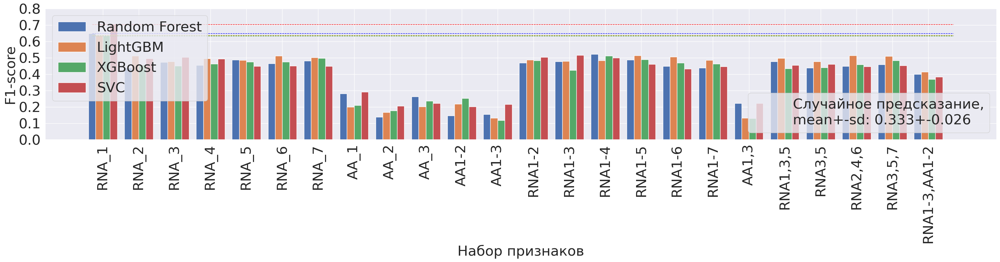

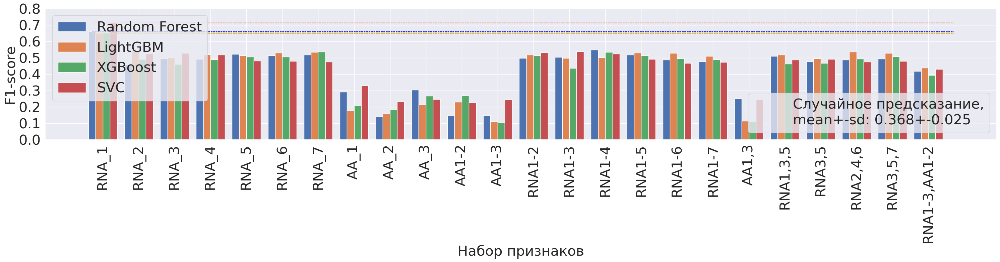

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.66      0.65     0.65  0.72
macro avg              0.65      0.63     0.63  0.70
weighted avg           0.66      0.65     0.65  0.71
             Random Forest LightGBM XGBoost    SVC
accuracy             RNA_1    RNA_1   RNA_1  RNA_1
macro avg            RNA_1    RNA_1   RNA_1  RNA_1
weighted avg         RNA_1    RNA_1   RNA_1  RNA_1


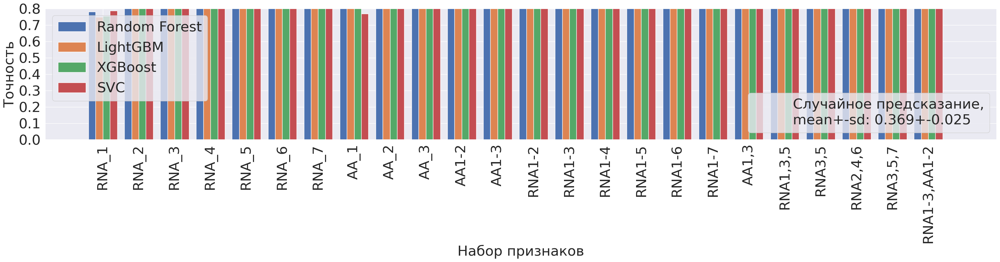

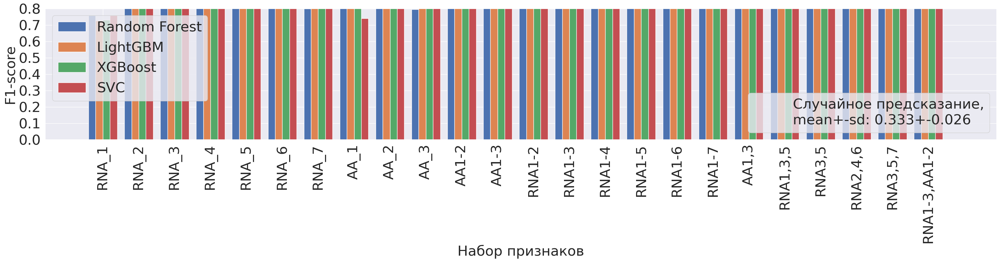

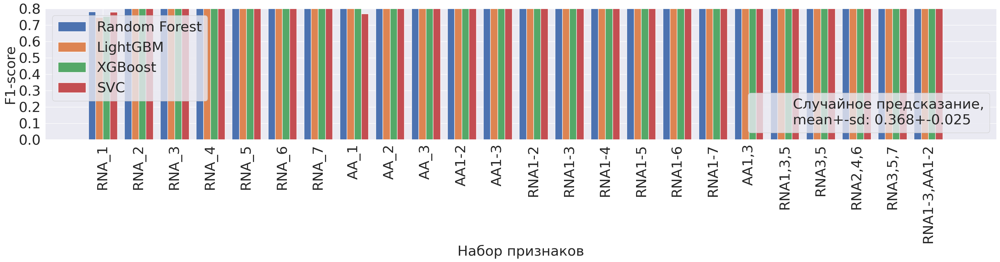

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.94      0.96     0.96  0.95
macro avg              0.93      0.95     0.95  0.95
weighted avg           0.94      0.96     0.96  0.95
             Random Forest      LightGBM       XGBoost     SVC
accuracy      RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-4
macro avg     RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-4
weighted avg  RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-4


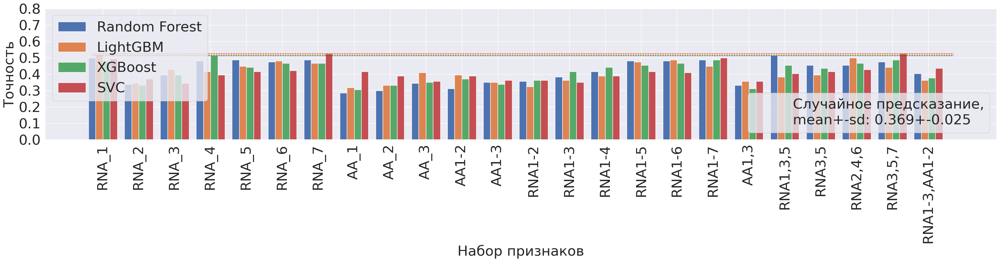

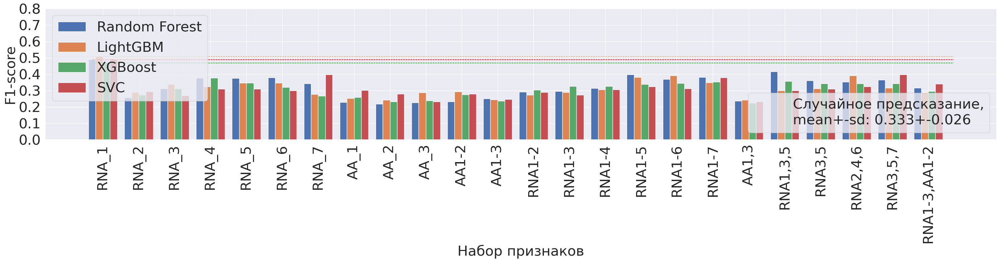

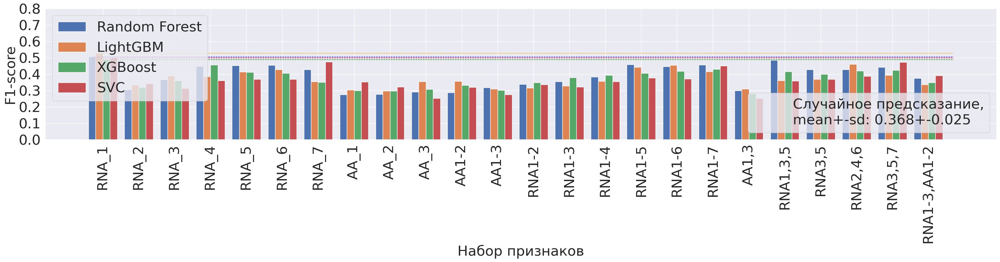

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.51      0.52     0.51  0.53
macro avg              0.49      0.51     0.47  0.49
weighted avg           0.51      0.53     0.49  0.50
             Random Forest LightGBM XGBoost    SVC
accuracy          RNA1,3,5    RNA_1   RNA_4  RNA_7
macro avg            RNA_1    RNA_1   RNA_1  RNA_1
weighted avg         RNA_1    RNA_1   RNA_1  RNA_1


In [76]:
bar_width = 0.2


with open(PATH_REPORTS + 'full//uncrossing//clfs_4methods_all_uncrossing.pkl', 'rb') as f1, \
    open(PATH_REPORTS + 'full//uncrossing//clfs_4methods_sole_uncrossing.pkl', 'rb') as f2, \
    open(PATH_REPORTS + 'full//crossing//clfs_4methods_all_crossing.pkl', 'rb') as f3, \
    open(PATH_REPORTS + 'full//crossing//clfs_4methods_sole_crossing.pkl', 'rb') as f4, \
    open(PATH_REPORTS + 'full//rhab//clfs_4methods_all_rhab.pkl', 'rb') as f5, \
    open(PATH_REPORTS + 'full//rhab//clfs_4methods_sole_rhab.pkl', 'rb') as f6:

    
    sets_names = ['uncrossing', 'crossing', 'rhabdoviridae']

    f_lst = [f1, f2, f3, f4, f5, f6]
    metrics = ['accuracy', 'macro avg', 'weighted avg']
    
    pic_headers = ['Непересекающиеся семейства вирусов', 'Мультиклассовые классификаторы', 'Рабдовирусы']
    metric_rus = ['точность', 'макро усреднённый F1-score', 'взвешенный F1-score']
    
    for set_index in range(len(sets_names)):
        
        pair_lst = list()
        pair_lst.append(pickle.load(f_lst[set_index*2]))
        pair_lst.append(pickle.load(f_lst[set_index*2+1]))
        all_accs = {**pair_lst[1], **pair_lst[0]}

        models = ['rf', 'lgbm', 'xgb', 'svc']
        hosts = ['Insecta', 'Mammalia', 'Viridiplantae']

        max_values = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])
        max_features = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])

        for met in metrics:
            
            fig, axis = plt.subplots(figsize=(30, 8))
            
            if met == 'accuracy':
                extra_word = ''
                name_rus = 'Точность'
                rf_values = [x[0][met] for x in all_accs.values()]
                lgbm_values = [x[1][met] for x in all_accs.values()]
                xgb_values = [x[2][met] for x in all_accs.values()]
                svm_values = [x[3][met] for x in all_accs.values()]
 


            else:
                extra_word = 'f1-score'
                name_rus = 'F1-score'
                rf_values = [x[0][met]['f1-score'] for x in all_accs.values()]
                lgbm_values = [x[1][met]['f1-score'] for x in all_accs.values()]
                xgb_values = [x[2][met]['f1-score'] for x in all_accs.values()]
                svm_values = [x[3][met]['f1-score'] for x in all_accs.values()]
            
            max_values_row = {'Random Forest':round(max(rf_values), 2), \
                              'LightGBM':round(max(lgbm_values), 2), \
                              'XGBoost':round(max(xgb_values), 2), \
                              'SVC':round(max(svm_values), 2)}
            max_values = max_values.append(max_values_row, ignore_index=True)
            
            max_features_row = {'Random Forest':list(all_accs.keys())[rf_values.index(max(rf_values))], \
                               'LightGBM':list(all_accs.keys())[lgbm_values.index(max(lgbm_values))], \
                               'XGBoost':list(all_accs.keys())[xgb_values.index(max(xgb_values))], \
                               'SVC':list(all_accs.keys())[svm_values.index(max(svm_values))]}
            max_features = max_features.append(max_features_row, ignore_index=True)
            
            
            accs = [rf_values, lgbm_values, xgb_values, svm_values]
            
            # Столбцы с качеством предсказания различными алгоритмами ML
            axis.bar([x for x in list(range(len(all_accs.keys())))], rf_values, bar_width, align='center', label="Random Forest")
            axis.bar([x+bar_width for x in list(range(len(all_accs.keys())))], lgbm_values, bar_width, align='center', label='LightGBM')
            axis.bar([x+bar_width*2 for x in list(range(len(all_accs.keys())))], xgb_values, bar_width, align='center', label='XGBoost')
            axis.bar([x+bar_width*3 for x in list(range(len(all_accs.keys())))], svm_values, bar_width, align='center', label='SVC')
            
            # Максимальные значения качества предсказания
            plt.hlines(y=max(rf_values), xmin=0, xmax=len(all_accs.keys()), colors='blue', linestyles='--', lw=1)
            plt.hlines(y=max(lgbm_values), xmin=0, xmax=len(all_accs.keys()), colors='orange', linestyles='--', lw=1)
            plt.hlines(y=max(xgb_values), xmin=0, xmax=len(all_accs.keys()), colors='green', linestyles='--', lw=1)
            plt.hlines(y=max(svm_values), xmin=0, xmax=len(all_accs.keys()), colors='red', linestyles='--', lw=1)
            
            # Среднее +- стандартное отклонение
            leg1_label= axis.plot([], [], ' ')
            leg1 = Legend(axis, leg1_label, ["Случайное предсказание,\nmean+-sd: " + str(round(random_pred_values['Mean'][metrics.index(met)], 3))+'+-'+str(round(random_pred_values['SD'][metrics.index(met)], 3))], loc='lower right', fontsize=30)
            axis.add_artist(leg1)
            
            #axis.set_title(pic_headers[set_index]+', '+metric_rus[metrics.index(met)], fontsize=40)
            axis.legend(fontsize=30, loc='upper left')
            #model = models[i]
            #axis[i].bar(range(len(all_accs.keys())), accs[i], align='center')
            #axis[i].set_title(model+' '+sets_names[set_index]+' accuracy')
            plt.sca(axis)
            plt.xticks([x+bar_width*1.5 for x in list(range(len(all_accs.keys())))], list(all_accs.keys()), fontsize=30, rotation=90)
            axis.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
            plt.ylim(0.0, 0.8)
            axis.tick_params('y', labelsize=30)
            

            plt.ylabel(name_rus, fontsize=30)
            plt.xlabel('Набор признаков', fontsize=30)

            fig.tight_layout()
            
            plt.savefig(PATH_FIGS+'clfs_'+sets_names[set_index]+'_'+met+'_'+extra_word+'.svg')
            plt.savefig(PATH_FIGS+'clfs_'+sets_names[set_index]+'_'+met+'_'+extra_word+'.png')
            
            plt.show()
            
        max_features.index = metrics
        max_values.index = metrics
        print(max_values)
        print(max_features)

In [70]:
pm = pickle.load(open(PATH_REPORTS + 'full//crossing//clfs_4methods_sole_crossing.pkl', 'rb'))

In [73]:
pm['RNA_5'][3]['weighted avg']['f1-score']

0.9493388921517109

In [74]:
pm['AA_1'][3]['weighted avg']['f1-score']

0.7681411729870895

# Случайные предсказания

In [10]:
def checker(l, p, n_classes, probs, bar_width, metric):
    
    # l - размер тестовой выборки
    # p - число итераций
    # n_classes - число классов
    # probs - представленность класса в выборке, в долях
    # bar_width - ширина колонки, чёткость графика
    # metric - метрика
    
    
    values = list(range(n_classes))
    accs = []
    for j in range(p):
        lst_1 = []
        for n in range(n_classes):
            for i in range(int(l*probs[n])):
                lst_1.append(values[n])


        random.shuffle(lst_1)
        arr_1 = np.array(lst_1)
        random.shuffle(arr_1)

        uniq = np.unique(np.array(lst_1), return_counts=True)
        stats = [x/l for x in uniq[1]]
        
        if metric == 'accuracy':
            metric_rus = 'Точность'
            accs.append(round(accuracy_score(np.array(lst_1), arr_1), 3))
        if metric == 'weighted f1-score':
            metric_rus = 'Взвешенный F1-score'
            accs.append(round(f1_score(np.array(lst_1), arr_1, average = 'weighted'), 3))
        if metric == 'macro average f1-score':
            metric_rus = 'Макро усреднённый F1-score'
            accs.append(round(f1_score(np.array(lst_1), arr_1, average = 'macro'), 3))
        
        #print('Accuracy score: ' + str(accuracy_score(np.array(lst_1), arr_1)))
        #print('Probabilitiy: ', dict(zip(uniq[0], stats)))
    
    if probs[0] == 1/n_classes:
        word = ' equal'
        smw = 'eq_probs_'
    else:
        word = ''
        smw = 'vf_hosts_'
    
    random_pred_med = statistics.median(accs)
    random_pred_mean = statistics.mean(accs)
    random_pred_sd = statistics.stdev(accs)     
    
    
    v_accs = np.unique(np.array(accs), return_counts=True)[0]
    c_accs = np.unique(np.array(accs), return_counts=True)[1]
    
    fig, axis = plt.subplots(figsize=(20, 8))

    axis.bar(v_accs, c_accs, bar_width, align='center')
    
    axis.set_ylabel('Число опытов', fontsize=30)
    plt.yticks(fontsize=30)
    axis.set_xlabel(metric_rus, fontsize=30)
    plt.xticks(fontsize=30)
    axis.set_title('Случайное предсказание' + word + '', fontsize=40)
    
    fig.tight_layout()
    fig.savefig(PATH_FIGS+smw+metric+'.png', dpi=fig.dpi)
    plt.show()
    
    return({'Median': random_pred_med, 'Mean': random_pred_mean, 'SD': random_pred_sd})

In [11]:
dd = np.unique(np.array(meta_df['virus family']), return_counts=True)
dict(zip(dd[0], dd[1]))
dh = np.unique(np.array(meta_df['host']), return_counts=True)
dict(zip(dh[0], dh[1]))

{'Insecta': 363, 'Mammalia': 675, 'Viridiplantae': 352}

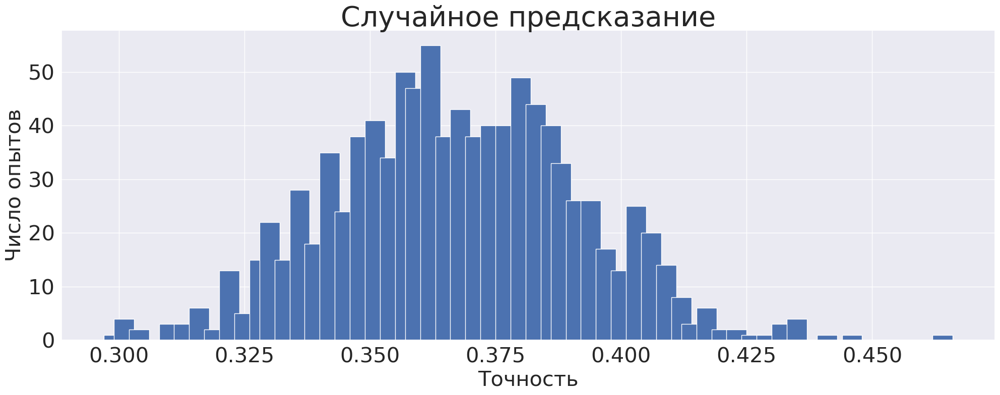

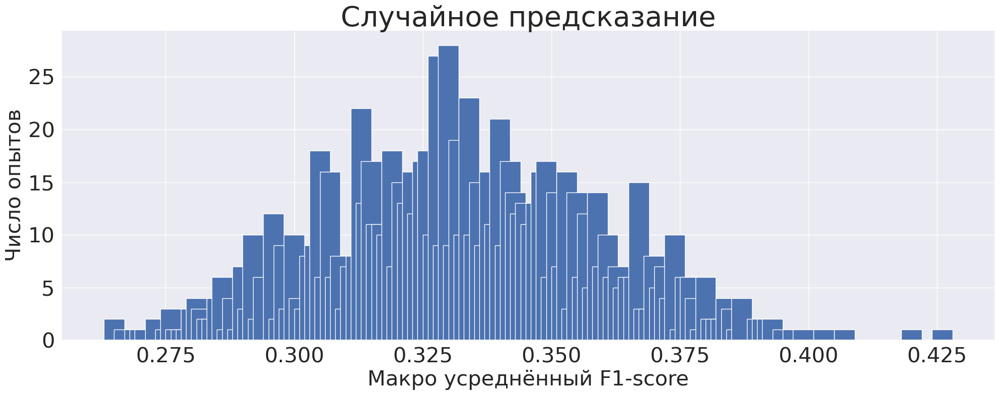

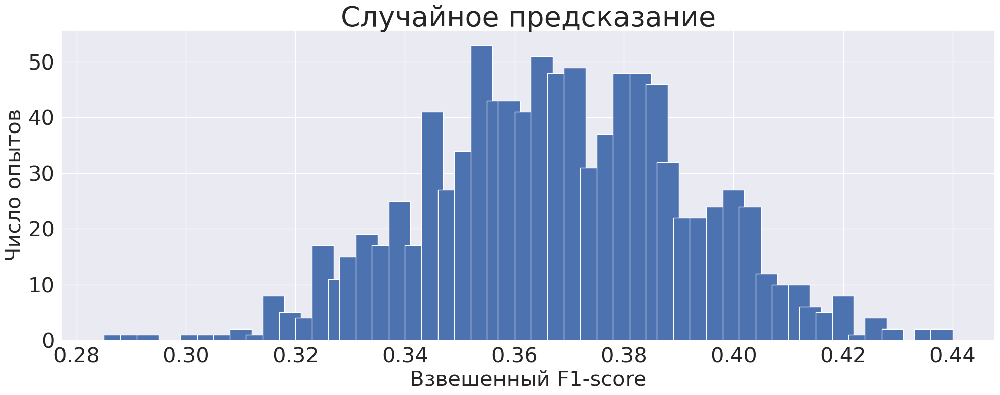

In [12]:
random_pred_values = pd.DataFrame(columns = ['Median', 'Mean', 'SD'])
for m in ['accuracy', 'macro average f1-score', 'weighted f1-score']:
    df_row = checker(346, 1000, 3, [round(x/len(meta_df), 3) for x in dh[1]], 0.004, m)
    random_pred_values = random_pred_values.append(df_row, ignore_index=True)
random_pred_values.index = ['accuracy', 'macro average f1-score', 'weighted f1-score']

# Графики по кусочкам последовательностей (Ranged)

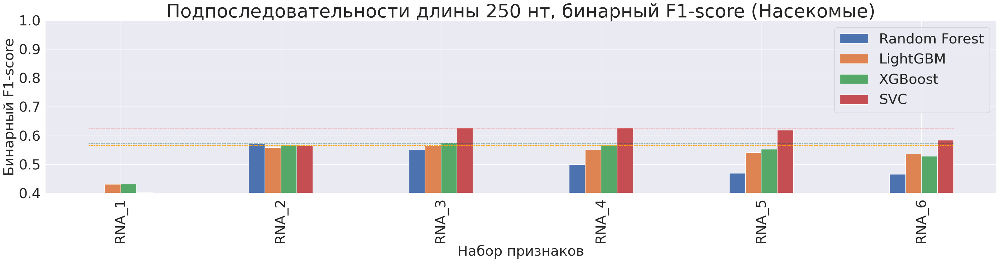

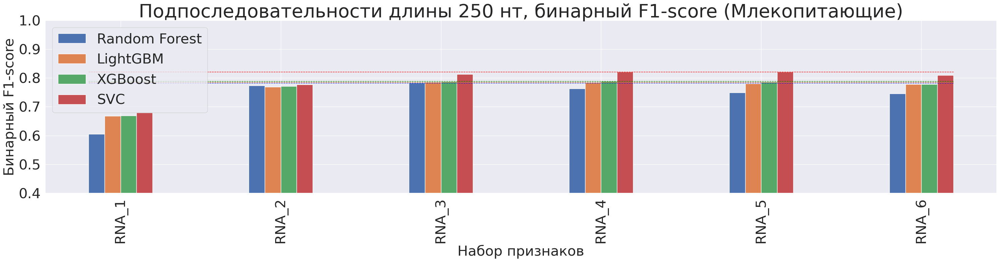

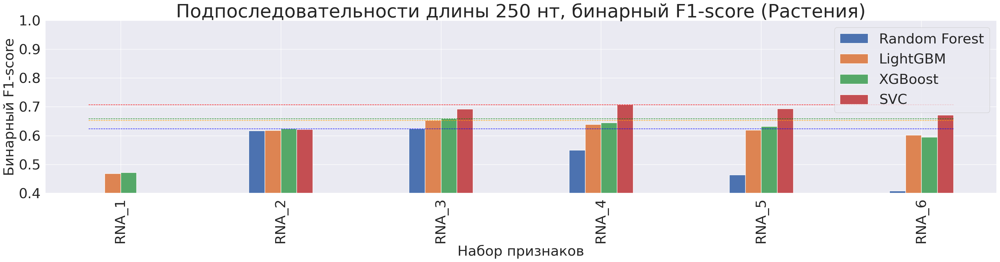

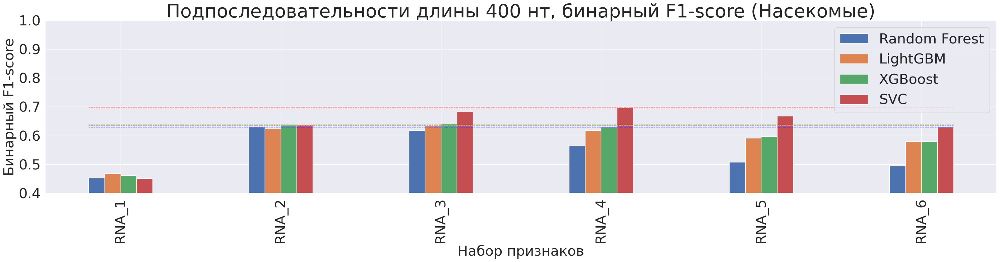

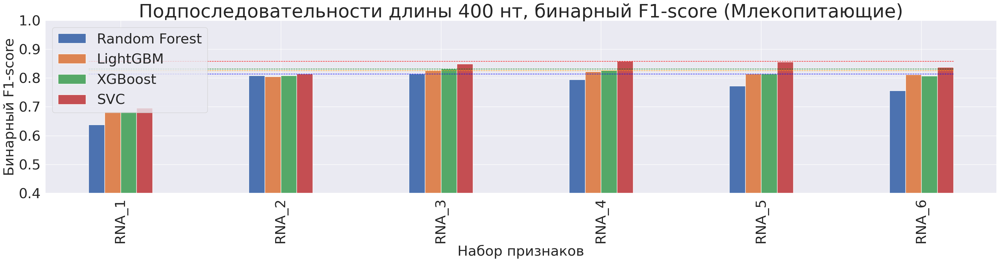

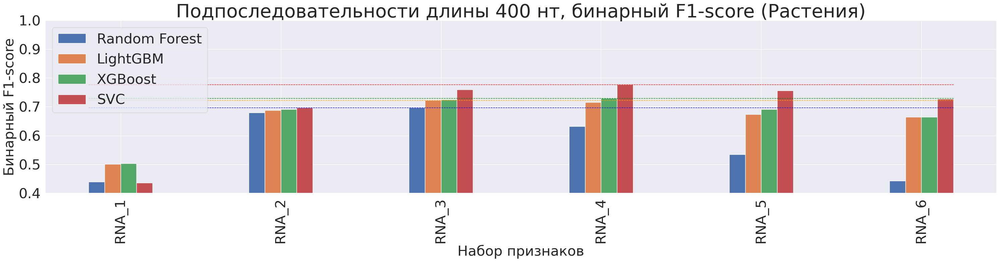

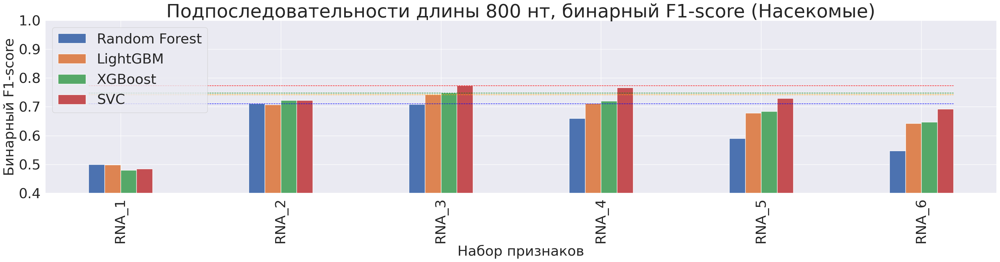

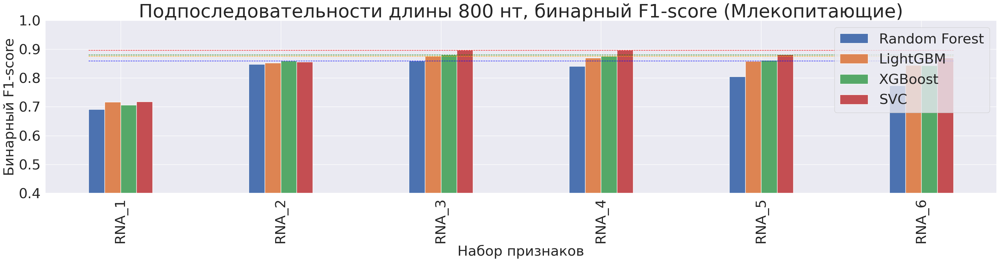

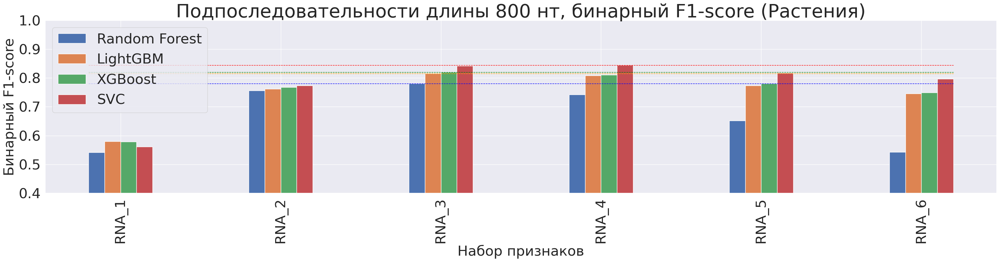

In [52]:
bar_width = 0.1


with open(PATH_REPORTS + 'ranged//crossing//clfs_4methods_250_sole_crossing.pkl', 'rb') as f1, \
    open(PATH_REPORTS + 'ranged//crossing//clfs_4methods_400_sole_crossing.pkl', 'rb') as f2, \
    open(PATH_REPORTS + 'ranged//crossing//clfs_4methods_800_sole_crossing.pkl', 'rb') as f3: 
    #open(PATH_REPORTS + 'ranged//uncrossing//clfs_4methods_400_sole_uncrossing.pkl', 'rb') as f2,
    #open(PATH_REPORTS + 'ranged//uncrossing//clfs_4methods_800_sole_uncrossing.pkl', 'rb') as f4:

    

    #f_lst = [f1, f2, f3, f4]
    #names = ['subsequence size 400, crossing', 'subsequence size 400, uncrossing', 'subsequence size 800, crossing', 'subsequence size 800, uncrossing']
    
    f_lst = [f1, f2, f3]
    names = ['subsequence size 250, crossing', 'subsequence size 400, crossing', 'subsequence size 800, crossing']
    names_rus = ['Подпоследовательности длины 250 нт', 'Подпоследовательности длины 400 нт', 'Подпоследовательности длины 800 нт']
    
    for name in names:

        all_accs = pickle.load(f_lst[names.index(name)])
        models = ['rf', 'lgbm', 'xgb', 'svc']
        hosts = ['Insecta', 'Mammalia', 'Viridiplantae']
        hosts_rus = ['Насекомые', 'Млекопитающие', 'Растения']



        for class_k in hosts:

            fig, axis = plt.subplots(figsize=(30, 8))

            rf_values = [x[0][class_k]['f1-score'] for x in all_accs.values()]
            lgbm_values = [x[1][class_k]['f1-score'] for x in all_accs.values()]
            xgb_values = [x[2][class_k]['f1-score'] for x in all_accs.values()]
            svm_values = [x[3][class_k]['f1-score'] for x in all_accs.values()]

            accs = [rf_values, lgbm_values, xgb_values, svm_values]

            axis.bar([x for x in list(range(len(all_accs.keys())))], rf_values, bar_width, align='center', label="Random Forest")
            axis.bar([x+bar_width for x in list(range(len(all_accs.keys())))], lgbm_values, bar_width, align='center', label='LightGBM')
            axis.bar([x+bar_width*2 for x in list(range(len(all_accs.keys())))], xgb_values, bar_width, align='center', label='XGBoost')
            axis.bar([x+bar_width*3 for x in list(range(len(all_accs.keys())))], svm_values, bar_width, align='center', label='SVC')
            
            # Максимальные значения
            plt.hlines(y=max(rf_values), xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='blue', linestyles='--', lw=1)
            plt.hlines(y=max(lgbm_values), xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='orange', linestyles='--', lw=1)
            plt.hlines(y=max(xgb_values), xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='green', linestyles='--', lw=1)
            plt.hlines(y=max(svm_values), xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='red', linestyles='--', lw=1)
            
    
            
            axis.set_title(names_rus[names.index(name)]+', бинарный F1-score ('+hosts_rus[hosts.index(class_k)]+')', fontsize=40)
            axis.legend(fontsize=30)
            #model = models[i]
            #axis[i].bar(range(len(all_accs.keys())), accs[i], align='center')
            #axis[i].set_title(model+' '+sets_names[set_index]+' accuracy')
            plt.sca(axis)
            plt.xticks([x+bar_width*1.5 for x in list(range(len(all_accs.keys())))], list(all_accs.keys()), fontsize=30, rotation=90)
            
            
            axis.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
            plt.ylim(0.4, 1)
            axis.tick_params('y', labelsize=30)
            plt.ylabel('Бинарный F1-score', fontsize=30)
            plt.xlabel('Набор признаков', fontsize=30)

            
            fig.tight_layout()

            plt.savefig(PATH_FIGS+'ranged//clfs_ranged_'+name.split(' ')[2][:-1]+'_'+name.split(',')[1]+'_'+class_k+'.svg')
            plt.savefig(PATH_FIGS+'ranged//clfs_ranged_'+name.split(' ')[2][:-1]+'_'+name.split(',')[1]+'_'+class_k+'.png')

            plt.show()

# GKM-SVM

In [15]:
### UNCROSSING

meta_df=pd.read_csv(PATH_FASTSK_DATA+'data_table.tsv', sep='\t', index_col='refseq id')
meta_df['indices'] = list(range(len(meta_df)))

test_ids, train_ids, test_indices_uncrossing, train_indices_uncrossing = [], [], {}, {}
for class_k in ['i', 'm', 'p']:
    test_index = []
    train_index = []
    seq_id_test = []
    with open(PATH_FASTSK_DATA+'uncrossing/full_uncrossing_test_'+ class_k +'.fasta', 'r') as test_f, \
    open(PATH_FASTSK_DATA+'uncrossing/full_uncrossing_train_'+ class_k +'.fasta', 'r') as train_f:
        i = -1
        for seq in SeqIO.parse(PATH_DATA+'data.fasta', 'fasta'):
            i+=1
            #print(seq.id)
            if not i == meta_df.loc[seq.id]['indices']:
                print('FAIL')
            if seq.id in future_sample_id_uncrossing:
                seq_id_test.append(seq.id)
                test_index.append(i)
                #seq.description = str(meta_df.loc[seq.id][class_k])
                #seq.id = seq.description
                #SeqIO.write(seq, test_f, 'fasta-2line')
            else:
                train_index.append(i)
                #seq.description = str(meta_df.loc[seq.id][class_k])
                #seq.id = seq.description
                #SeqIO.write(seq, train_f, 'fasta-2line')
                
                  
    test_indices_uncrossing[class_k] = test_index
    train_indices_uncrossing[class_k] = train_index
    
    
    
#meta_df=pd.read_csv(PATH_DATA+'data_table.tsv', sep='\t', index_col = 'refseq id')
y = np.array(meta_df['host'])

pre = preprocessing.LabelEncoder()
pre.fit(['Insecta', 'Mammalia', 'Viridiplantae'])  
y_int = pre.transform(y)
family = np.array(meta_df['virus family'])

y_insects = np.array(y_int == 0).astype(int)
y_mammals = np.array(y_int == 1).astype(int)
y_plants = np.array(y_int == 2).astype(int)

meta_df['i'] = y_insects
meta_df['m'] = y_mammals
meta_df['p'] = y_plants


proba_dicts = []
for class_k in ['i', 'm', 'p']:
    proba_dicts.append(pickle.load(open(PATH_FASTSK_REPORTS + 'uncrossing/gkm_uncrossing_probs_dict_' + class_k + '.pkl', 'rb')))
    
all_accs = dict()

for key in proba_dicts[0].keys():
    y_proba = np.zeros(shape=proba_dicts[0]['2,1'].shape)

    for i in range(3):
        y_proba = np.vstack((y_proba, proba_dicts[i][key]))
    
    y_proba = y_proba[1:]
    y_proba = (y_proba/y_proba.sum(axis=0))
    y_pred_all = np.argmax(y_proba, axis=0)
    all_accs[key] = f1_score(y_int[list(meta_df.loc[future_sample_id_uncrossing]['indices'])], y_pred_all, average='weighted')
    
fig, axis = plt.subplots(1, 1, figsize=(8, 8))

axis.bar(range(len(all_accs.keys())), all_accs.values(), align='center')
axis.set_title('GKM-SVM'+' Uncrossing'+' f1-score weighted, 3 classes')
plt.sca(axis)
plt.xticks(range(len(all_accs.keys())), list(all_accs.keys()), rotation=90)
plt.ylim(0, 0.9)

fig.tight_layout()

plt.savefig(PATH_FIGS+'gkm/fastsk_uncrossing_weighted_f1-score'+'.svg')
plt.savefig(PATH_FIGS+'gkm/fastsk_uncrossing_weighted_f1-score'+'.png')

plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/home/parazit/ml_virus_host/v2.0/fastsk/reports/uncrossing/gkm_uncrossing_probs_dict_m.pkl'

In [16]:
### CROSSING

meta_df=pd.read_csv(PATH_FASTSK_DATA+'data_table.tsv', sep='\t', index_col='refseq id')
meta_df['indices'] = list(range(len(meta_df)))

test_ids, train_ids, test_indices_crossing, train_indices_crossing = [], [], {}, {}
for class_k in ['i', 'm', 'p']:
    test_index = []
    train_index = []
    seq_id_test = []
    with open(PATH_FASTSK_DATA+'crossing/it0/full_crossing_test_'+ class_k +'_it0.fasta', 'r') as test_f, \
    open(PATH_FASTSK_DATA+'crossing/it0/full_crossing_train_'+ class_k +'_it0.fasta', 'r') as train_f:
        i = -1
        for seq in SeqIO.parse(PATH_DATA+'data.fasta', 'fasta'):
            i+=1
            #print(seq.id)
            if not i == meta_df.loc[seq.id]['indices']:
                print('FAIL')
            if seq.id in future_sample_id_crossing:
                seq_id_test.append(seq.id)
                test_index.append(i)
                #seq.description = str(meta_df.loc[seq.id][class_k])
                #seq.id = seq.description
                #SeqIO.write(seq, test_f, 'fasta-2line')
            else:
                train_index.append(i)
                #seq.description = str(meta_df.loc[seq.id][class_k])
                #seq.id = seq.description
                #SeqIO.write(seq, train_f, 'fasta-2line')
                
                  
    test_indices_crossing[class_k] = test_index
    train_indices_crossing[class_k] = train_index

NameError: name 'metrics' is not defined

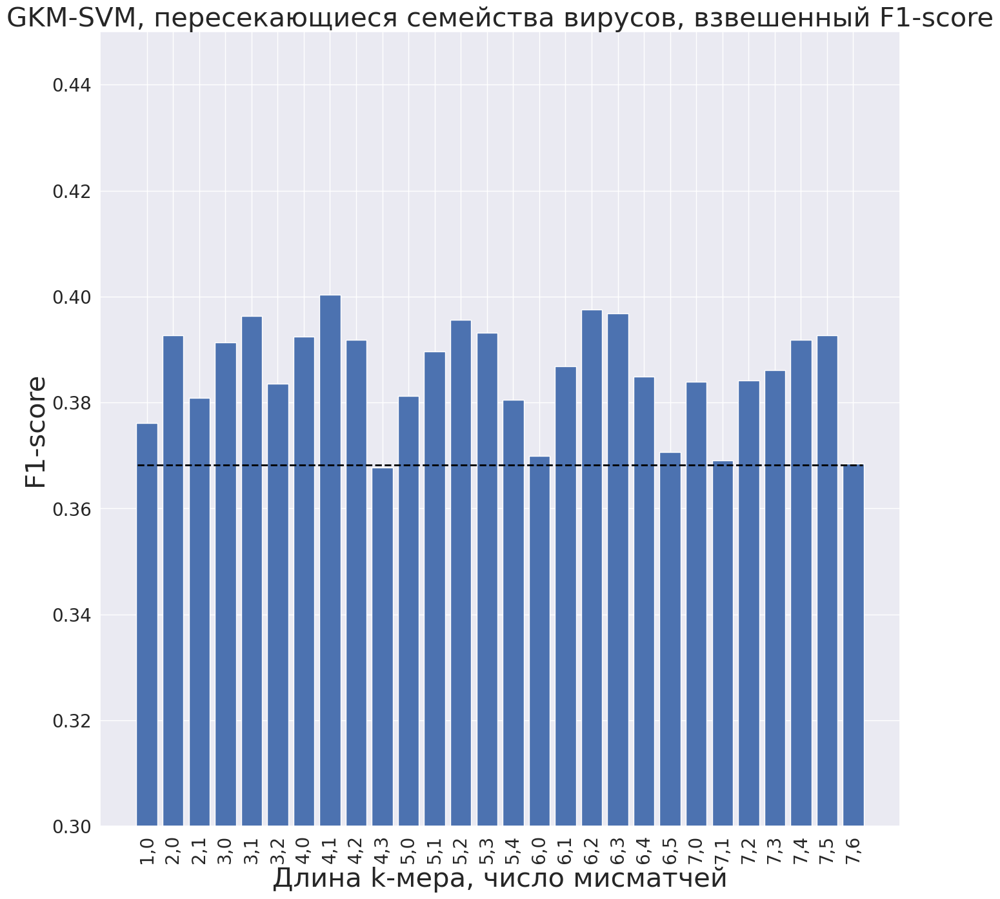

In [17]:
#meta_df=pd.read_csv(PATH_DATA+'data_table.tsv', sep='\t', index_col = 'refseq id')
y = np.array(meta_df['host'])

pre = preprocessing.LabelEncoder()
pre.fit(['Insecta', 'Mammalia', 'Viridiplantae'])  
y_int = pre.transform(y)
family = np.array(meta_df['virus family'])

y_insects = np.array(y_int == 0).astype(int)
y_mammals = np.array(y_int == 1).astype(int)
y_plants = np.array(y_int == 2).astype(int)

meta_df['i'] = y_insects
meta_df['m'] = y_mammals
meta_df['p'] = y_plants


proba_dicts = []
for class_k in ['i', 'm', 'p']:
    proba_dicts.append(pickle.load(open(PATH_FASTSK_REPORTS + 'crossing/it0/gkm_crossing_probs_dict_' + class_k + '_it0.pkl', 'rb')))
    
all_accs = dict()

for key in proba_dicts[0].keys():
    y_proba = np.zeros(shape=proba_dicts[0]['2,1'].shape)

    for i in range(3):
        y_proba = np.vstack((y_proba, proba_dicts[i][key]))
    
    y_proba = y_proba[1:]
    y_proba = (y_proba/y_proba.sum(axis=0))
    y_pred_all = np.argmax(y_proba, axis=0)
    all_accs[key] = f1_score(y_int[list(meta_df.loc[future_sample_id_crossing]['indices'])], y_pred_all, average='weighted')
    
fig, axis = plt.subplots(1, 1, figsize=(16, 16))

axis.bar(range(len(all_accs.keys())), all_accs.values(), align='center')
axis.set_title('GKM-SVM, пересекающиеся семейства вирусов, взвешенный F1-score', fontsize=30)
plt.sca(axis)
plt.xticks(range(len(all_accs.keys())), list(all_accs.keys()), rotation=90, fontsize=20)
plt.ylim(0.3, 0.45)
axis.tick_params('y', labelsize=20)
            

plt.ylabel('F1-score', fontsize=30)
plt.xlabel('Длина k-мера, число мисматчей', fontsize=30)

# Среднее +- стандартное отклонение
plt.hlines(y=random_pred_values['Mean'][2], xmin=-0.35, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=2)
#plt.hlines(y=random_pred_values['Mean'][metrics.index(met)] + 3*random_pred_values['SD'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
#plt.hlines(y=random_pred_values['Mean'][metrics.index(met)] - 3*random_pred_values['SD'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
leg1_label= axis.plot([], [], ' ')
leg1 = Legend(axis, leg1_label, ["Случайное предсказание,\nmean+-sd: " + str(round(random_pred_values['Mean'][metrics.index(met)], 3))+'+-'+str(round(random_pred_values['SD'][metrics.index(met)], 3))], loc='upper right', fontsize=30)
axis.add_artist(leg1)

fig.tight_layout()

plt.savefig(PATH_FIGS+'gkm/fastsk_crossing_weighted_f1-score'+'.svg')
plt.savefig(PATH_FIGS+'gkm/fastsk_crossing_weighted_f1-score'+'.png')

plt.show()

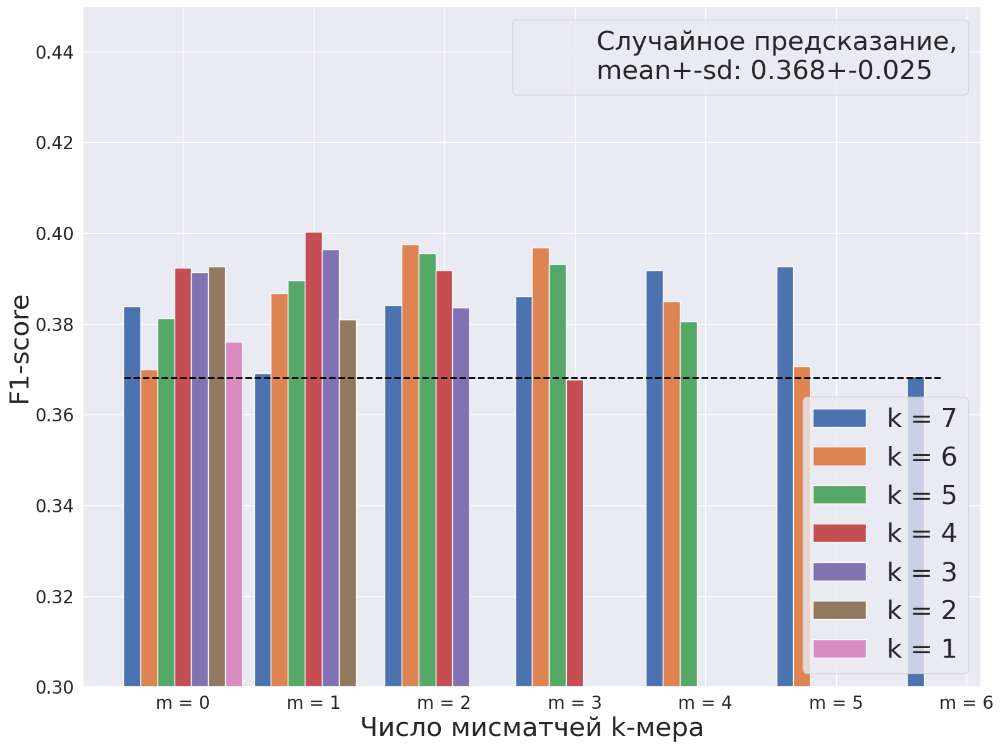

In [83]:
bar_width = 0.13
y = np.array(meta_df['host'])

pre = preprocessing.LabelEncoder()
pre.fit(['Insecta', 'Mammalia', 'Viridiplantae'])  
y_int = pre.transform(y)
family = np.array(meta_df['virus family'])

y_insects = np.array(y_int == 0).astype(int)
y_mammals = np.array(y_int == 1).astype(int)
y_plants = np.array(y_int == 2).astype(int)

meta_df['i'] = y_insects
meta_df['m'] = y_mammals
meta_df['p'] = y_plants


proba_dicts = []
for class_k in ['i', 'm', 'p']:
    proba_dicts.append(pickle.load(open(PATH_FASTSK_REPORTS + 'crossing/it0/gkm_crossing_probs_dict_' + class_k + '_it0.pkl', 'rb')))
    
all_accs = dict()

for key in proba_dicts[0].keys():
    y_proba = np.zeros(shape=proba_dicts[0]['2,1'].shape)

    for i in range(3):
        y_proba = np.vstack((y_proba, proba_dicts[i][key]))
    
    y_proba = y_proba[1:]
    y_proba = (y_proba/y_proba.sum(axis=0))
    y_pred_all = np.argmax(y_proba, axis=0)
    all_accs[key] = f1_score(y_int[list(meta_df.loc[future_sample_id_crossing]['indices'])], y_pred_all, average='weighted')
    
fig, axis = plt.subplots(1, 1, figsize=(16, 12))


#axis.set_title('GKM-SVM, пересекающиеся семейства вирусов, взвешенный F1-score', fontsize=30)
plt.sca(axis)
plt.xticks(range(len(list(all_accs.keys())[21:])), ['m = ' +str(x) for x in (range(0, 7))], rotation=0, fontsize=20)

axis.bar([x-3*bar_width for x in range(len(list(all_accs.keys())[21:]))], list(all_accs.values())[21:], align='center', width=bar_width, label="k = 7")
axis.bar([x-2*bar_width for x in range(len(list(all_accs.keys())[15:21]))], list(all_accs.values())[15:21], align='center', width=bar_width, label="k = 6")
axis.bar([x-1*bar_width for x in range(len(list(all_accs.keys())[10:15]))], list(all_accs.values())[10:15], align='center', width=bar_width, label="k = 5")
axis.bar([x+0*bar_width for x in range(len(list(all_accs.keys())[6:10]))], list(all_accs.values())[6:10], align='center', width=bar_width, label="k = 4")
axis.bar([x+1*bar_width for x in range(len(list(all_accs.keys())[3:6]))], list(all_accs.values())[3:6], align='center', width=bar_width, label="k = 3")
axis.bar([x+2*bar_width for x in range(len(list(all_accs.keys())[1:3]))], list(all_accs.values())[1:3], align='center', width=bar_width, label="k = 2")
axis.bar(3*bar_width, list(all_accs.values())[0], align='center', width=bar_width, label="k = 1")

plt.ylim(0.3, 0.45)
axis.tick_params('y', labelsize=20)
            

plt.ylabel('F1-score', fontsize=30)
plt.xlabel('Число мисматчей k-мера', fontsize=30)

# Среднее +- стандартное отклонение
plt.hlines(y=random_pred_values['Mean'][2], xmin=-0.45, xmax=len(list(all_accs.keys())[21:])-1.2, colors='black', linestyles='--', lw=2)
#plt.hlines(y=random_pred_values['Mean'][metrics.index(met)] + 3*random_pred_values['SD'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
#plt.hlines(y=random_pred_values['Mean'][metrics.index(met)] - 3*random_pred_values['SD'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
leg1_label= axis.plot([], [], ' ')
leg1 = Legend(axis, leg1_label, ["Случайное предсказание,\nmean+-sd: " + str(round(random_pred_values['Mean'][metrics.index(met)], 3))+'+-'+str(round(random_pred_values['SD'][metrics.index(met)], 3))], loc='upper right', fontsize=30)
axis.add_artist(leg1)
axis.legend(fontsize=30, loc='lower right')
fig.tight_layout()

plt.savefig(PATH_FIGS+'gkm/fastsk_crossing_weighted_f1-score'+'.svg')
plt.savefig(PATH_FIGS+'gkm/fastsk_crossing_weighted_f1-score'+'.png')

plt.show()

In [18]:
def get_k_mers_names(a, m):
    a, tmp, tmp_index = list(a), [], []
    for el in a:
        if el.split(',')[1] == str(m):
            tmp.append(el)
            tmp_index.append(a.index(el))
    return(tmp, tmp_index)

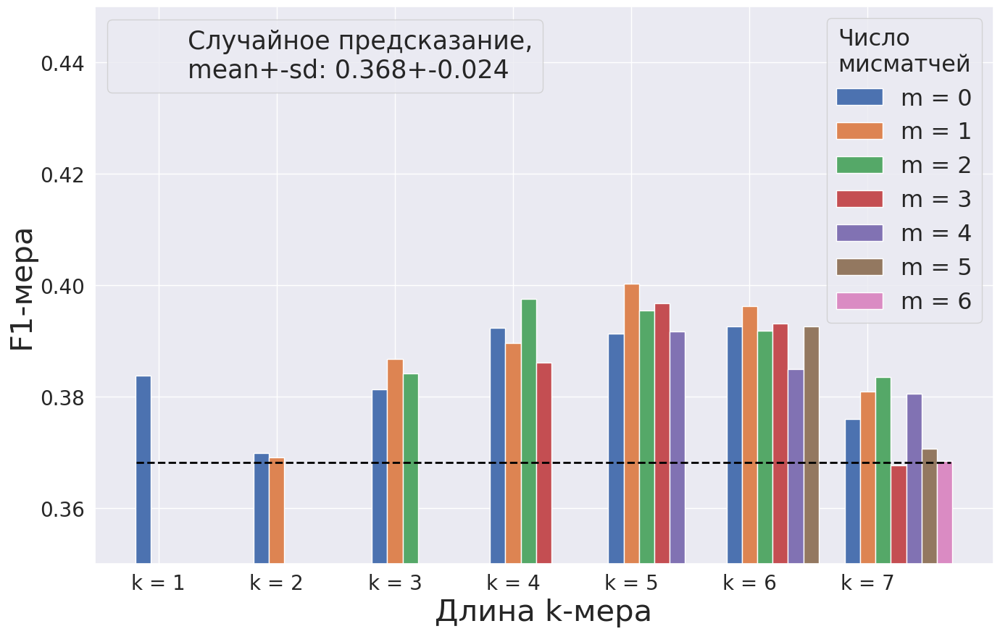

In [23]:
bar_width = 0.13
y = np.array(meta_df['host'])

pre = preprocessing.LabelEncoder()
pre.fit(['Insecta', 'Mammalia', 'Viridiplantae'])  
y_int = pre.transform(y)
family = np.array(meta_df['virus family'])

y_insects = np.array(y_int == 0).astype(int)
y_mammals = np.array(y_int == 1).astype(int)
y_plants = np.array(y_int == 2).astype(int)

meta_df['i'] = y_insects
meta_df['m'] = y_mammals
meta_df['p'] = y_plants


proba_dicts = []
for class_k in ['i', 'm', 'p']:
    proba_dicts.append(pickle.load(open(PATH_FASTSK_REPORTS + 'crossing/it0/gkm_crossing_probs_dict_' + class_k + '_it0.pkl', 'rb')))
    
all_accs = dict()

for key in proba_dicts[0].keys():
    y_proba = np.zeros(shape=proba_dicts[0]['2,1'].shape)

    for i in range(3):
        y_proba = np.vstack((y_proba, proba_dicts[i][key]))
    
    y_proba = y_proba[1:]
    y_proba = (y_proba/y_proba.sum(axis=0))
    y_pred_all = np.argmax(y_proba, axis=0)
    all_accs[key] = f1_score(y_int[list(meta_df.loc[future_sample_id_crossing]['indices'])], y_pred_all, average='weighted')
    
fig, axis = plt.subplots(1, 1, figsize=(16, 10))


#axis.set_title('GKM-SVM, пересекающиеся семейства вирусов, взвешенный F1-score', fontsize=30)
plt.sca(axis)
plt.xticks(range(len(list(all_accs.keys())[21:])), ['k = ' +str(x) for x in (range(1, 8))], rotation=0, fontsize=20)

axis.bar([x-1*bar_width for x in range(len(get_k_mers_names(all_accs.keys(), 0)[0]))], list([list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 0)[1]])[::-1], align='center', width=bar_width, label="m = 0")
axis.bar([x+0*bar_width for x in range(len(get_k_mers_names(all_accs.keys(), 0)[0]))], list([list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 1)[1]]+[0])[::-1], align='center', width=bar_width, label="m = 1")
axis.bar([x+1*bar_width for x in range(len(get_k_mers_names(all_accs.keys(), 0)[0]))], list([list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 2)[1]]+[0]*2)[::-1], align='center', width=bar_width, label="m = 2")
axis.bar([x+2*bar_width for x in range(len(get_k_mers_names(all_accs.keys(), 0)[0]))], list([list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 3)[1]]+[0]*3)[::-1], align='center', width=bar_width, label="m = 3")
axis.bar([x+3*bar_width for x in range(len(get_k_mers_names(all_accs.keys(), 0)[0]))], list([list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 4)[1]]+[0]*4)[::-1], align='center', width=bar_width, label="m = 4")
axis.bar([x+4*bar_width for x in range(len(get_k_mers_names(all_accs.keys(), 0)[0]))], list([list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 5)[1]]+[0]*5)[::-1], align='center', width=bar_width, label="m = 5")
axis.bar([x+5*bar_width for x in range(len(get_k_mers_names(all_accs.keys(), 0)[0]))], list([list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 6)[1]]+[0]*6)[::-1], align='center', width=bar_width, label="m = 6")

plt.ylim(0.35, 0.45)
axis.tick_params('y', labelsize=20)
            

plt.ylabel('F1-мера', fontsize=30)
plt.xlabel('Длина k-мера', fontsize=30)

# Среднее +- стандартное отклонение
plt.hlines(y=random_pred_values['Mean'][2], xmin=-0.19, xmax=len(list(all_accs.keys())[21:])-0.3, colors='black', linestyles='--', lw=2)
#plt.hlines(y=random_pred_values['Mean'][metrics.index(met)] + 3*random_pred_values['SD'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
#plt.hlines(y=random_pred_values['Mean'][metrics.index(met)] - 3*random_pred_values['SD'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
leg1_label= axis.plot([], [], ' ')
leg1 = Legend(axis, leg1_label, ["Случайное предсказание,\nmean+-sd: " + str(round(random_pred_values['Mean'][metrics.index(met)], 3))+'+-'+str(round(random_pred_values['SD'][metrics.index(met)], 3))], loc='upper left', fontsize=25)
axis.add_artist(leg1)
axis.legend(title="Число\nмисматчей", fontsize=23, loc='upper right')
plt.rcParams['legend.title_fontsize'] = 23
#fig.tight_layout()

plt.savefig(PATH_FIGS+'gkm/fastsk_crossing_weighted_f1-score'+'.svg')
plt.savefig(PATH_FIGS+'gkm/fastsk_crossing_weighted_f1-score'+'.png')

plt.show()

In [113]:
tmp = [x-3*bar_width for x in range(len(list(all_accs.keys())[21:]))]

[-0.39, 0.61, 1.6099999999999999, 2.61, 3.61, 4.61, 5.61]

In [210]:
[x/10 for x in range(0, 7)][::-1]

[0.6, 0.5, 0.4, 0.3, 0.2, 0.1, 0.0]

In [219]:
[list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 0)[1]]+[0]*2

[0.37606541016280143,
 0.3926257026835566,
 0.3913382239030161,
 0.3923941891464571,
 0.3812805977074332,
 0.36987930801037855,
 0.3838477484959577,
 0,
 0]

In [154]:
[list(all_accs.values())[i] for i in get_k_mers_names(all_accs.keys(), 6)[1]]

[0.3684214446789759]

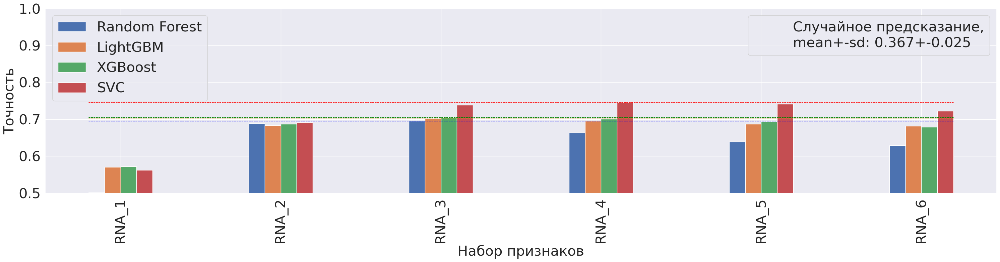

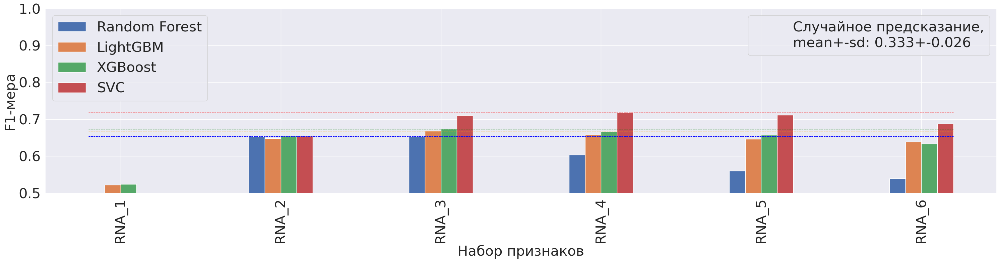

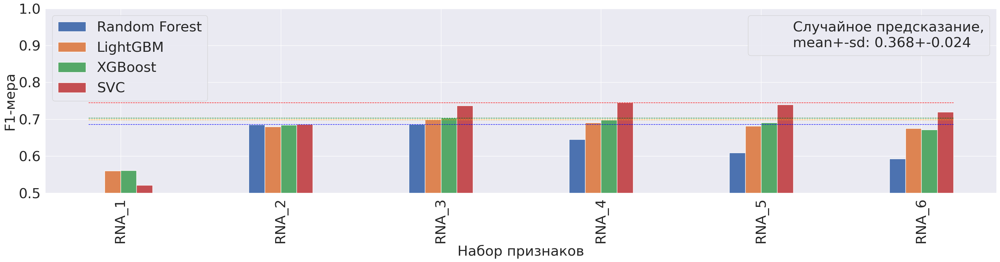

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.70      0.70     0.71  0.75
macro avg              0.65      0.67     0.67  0.72
weighted avg           0.69      0.70     0.70  0.74
             Random Forest LightGBM XGBoost    SVC
accuracy             RNA_3    RNA_3   RNA_3  RNA_4
macro avg            RNA_2    RNA_3   RNA_3  RNA_4
weighted avg         RNA_3    RNA_3   RNA_3  RNA_4


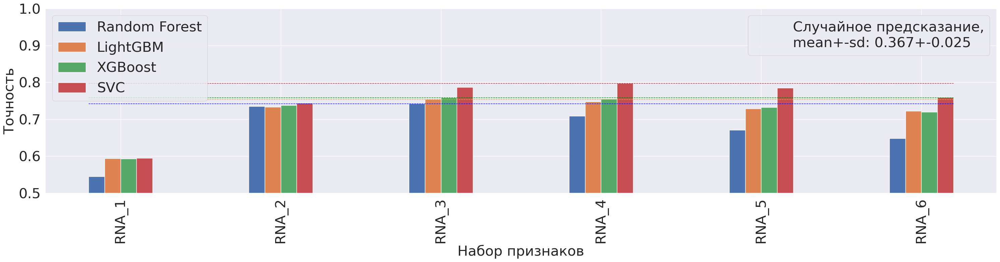

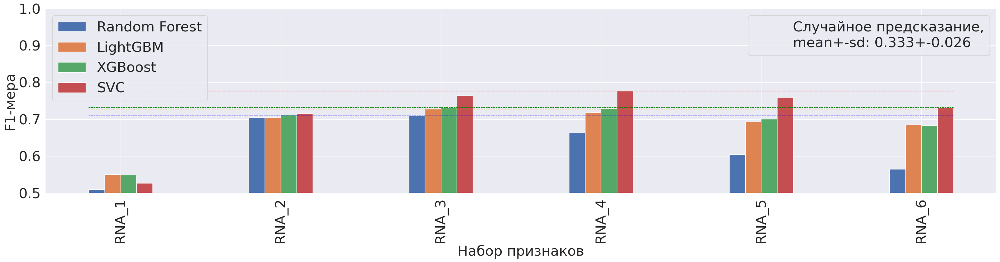

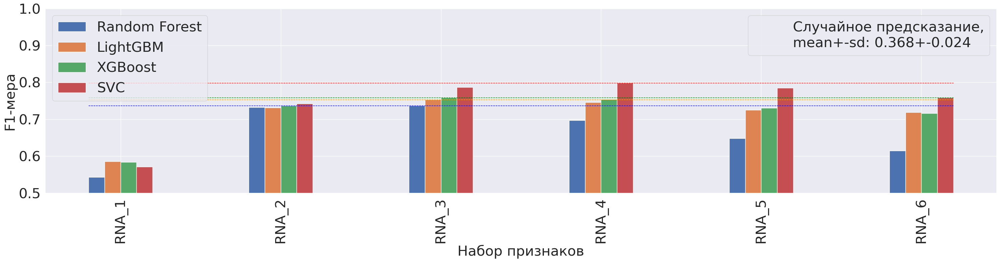

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.74      0.75     0.76  0.80
macro avg              0.71      0.73     0.73  0.78
weighted avg           0.74      0.75     0.76  0.80
             Random Forest LightGBM XGBoost    SVC
accuracy             RNA_3    RNA_3   RNA_3  RNA_4
macro avg            RNA_3    RNA_3   RNA_3  RNA_4
weighted avg         RNA_3    RNA_3   RNA_3  RNA_4


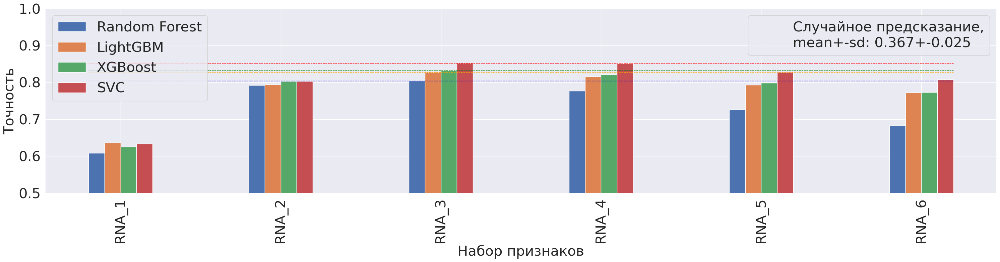

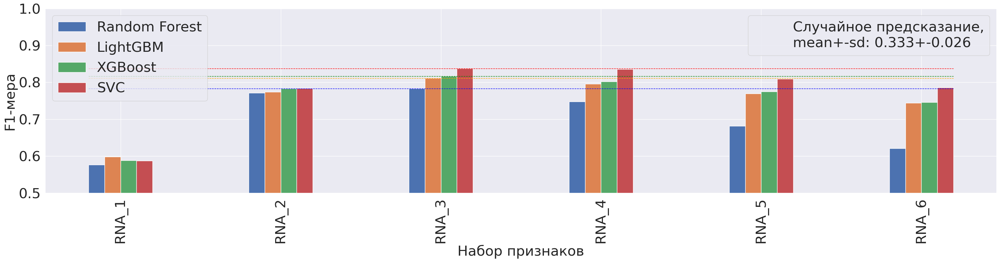

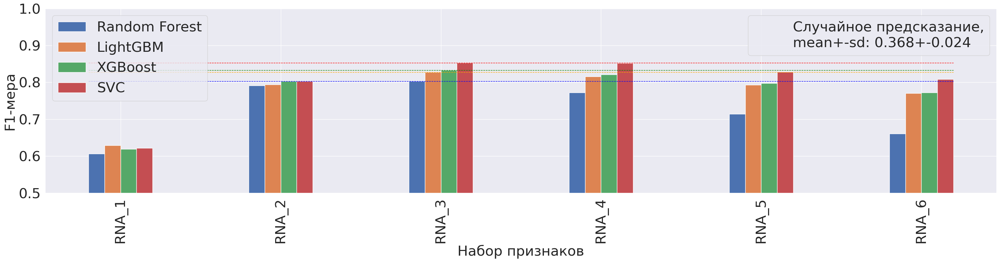

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.80      0.83     0.83  0.85
macro avg              0.78      0.81     0.82  0.84
weighted avg           0.80      0.83     0.83  0.85
             Random Forest LightGBM XGBoost    SVC
accuracy             RNA_3    RNA_3   RNA_3  RNA_3
macro avg            RNA_3    RNA_3   RNA_3  RNA_3
weighted avg         RNA_3    RNA_3   RNA_3  RNA_3


In [20]:
bar_width = 0.1


with open(PATH_REPORTS + 'ranged/crossing/clfs_4methods_250_sole_crossing.pkl', 'rb') as f1, \
    open(PATH_REPORTS + 'ranged/crossing/clfs_4methods_400_sole_crossing.pkl', 'rb') as f2, \
    open(PATH_REPORTS + 'ranged/crossing/clfs_4methods_800_sole_crossing.pkl', 'rb') as f3: 
    

    f_lst = [f1, f2, f3]
    metrics = ['accuracy', 'macro avg', 'weighted avg']
    
    pic_headers = ['Непересекающиеся семейства вирусов', 'Пересекающиеся семейства вирусов', 'Рабдовирусы']
    metric_rus = ['точность', 'макро усреднённый F1-score', 'взвешенный F1-score']
    
    names = ['subsequence size 250, crossing', 'subsequence size 400, crossing', 'subsequence size 800, crossing']
    names_rus = ['Подпоследовательности длины 250 нт', 'Подпоследовательности длины 400 нт', 'Подпоследовательности длины 800 нт']
    
    for name in names:

        all_accs = pickle.load(f_lst[names.index(name)])
        models = ['rf', 'lgbm', 'xgb', 'svc']
        hosts = ['Insecta', 'Mammalia', 'Viridiplantae']
        hosts_rus = ['Насекомые', 'Млекопитающие', 'Растения']

        max_values = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])
        max_features = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])
        
        for met in metrics:
            
            fig, axis = plt.subplots(figsize=(30, 8))
            
            if met == 'accuracy':
                extra_word = ''
                name_rus = 'Точность'
                rf_values = [x[0][met] for x in all_accs.values()]
                lgbm_values = [x[1][met] for x in all_accs.values()]
                xgb_values = [x[2][met] for x in all_accs.values()]
                svm_values = [x[3][met] for x in all_accs.values()]
 


            else:
                extra_word = 'f1-score'
                name_rus = 'F1-мера'
                rf_values = [x[0][met]['f1-score'] for x in all_accs.values()]
                lgbm_values = [x[1][met]['f1-score'] for x in all_accs.values()]
                xgb_values = [x[2][met]['f1-score'] for x in all_accs.values()]
                svm_values = [x[3][met]['f1-score'] for x in all_accs.values()]
            
            max_values_row = {'Random Forest':round(max(rf_values), 2), \
                              'LightGBM':round(max(lgbm_values), 2), \
                              'XGBoost':round(max(xgb_values), 2), \
                              'SVC':round(max(svm_values), 2)}
            max_values = max_values.append(max_values_row, ignore_index=True)
            
            max_features_row = {'Random Forest':list(all_accs.keys())[rf_values.index(max(rf_values))], \
                               'LightGBM':list(all_accs.keys())[lgbm_values.index(max(lgbm_values))], \
                               'XGBoost':list(all_accs.keys())[xgb_values.index(max(xgb_values))], \
                               'SVC':list(all_accs.keys())[svm_values.index(max(svm_values))]}
            max_features = max_features.append(max_features_row, ignore_index=True)
            
            accs = [rf_values, lgbm_values, xgb_values, svm_values]
            
            # Качество предсказаний различными моделями 
            axis.bar([x for x in list(range(len(all_accs.keys())))], rf_values, bar_width, align='center', label="Random Forest")
            axis.bar([x+bar_width for x in list(range(len(all_accs.keys())))], lgbm_values, bar_width, align='center', label='LightGBM')
            axis.bar([x+bar_width*2 for x in list(range(len(all_accs.keys())))], xgb_values, bar_width, align='center', label='XGBoost')
            axis.bar([x+bar_width*3 for x in list(range(len(all_accs.keys())))], svm_values, bar_width, align='center', label='SVC')
            axis.legend(fontsize=30, loc = 'upper left')
            
            # Среднее +- стандартное отклонение
            plt.hlines(y=random_pred_values['Mean'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
            plt.hlines(y=random_pred_values['Mean'][metrics.index(met)] + 3*random_pred_values['SD'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
            plt.hlines(y=random_pred_values['Mean'][metrics.index(met)] - 3*random_pred_values['SD'][metrics.index(met)], xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='black', linestyles='--', lw=1)
            leg1_label= axis.plot([], [], ' ')
            leg1 = Legend(axis, leg1_label, ["Случайное предсказание,\nmean+-sd: " + str(round(random_pred_values['Mean'][metrics.index(met)], 3))+'+-'+str(round(random_pred_values['SD'][metrics.index(met)], 3))], loc='upper right', fontsize=30)
            axis.add_artist(leg1)
            
            
            # Максимальные значения
            plt.hlines(y=max(rf_values), xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='blue', linestyles='--', lw=1)
            plt.hlines(y=max(lgbm_values), xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='orange', linestyles='--', lw=1)
            plt.hlines(y=max(xgb_values), xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='green', linestyles='--', lw=1)
            plt.hlines(y=max(svm_values), xmin=-0.05, xmax=len(all_accs.keys())-0.65, colors='red', linestyles='--', lw=1)
            
            #axis.set_title(names_rus[names.index(name)]+', '+metric_rus[metrics.index(met)], fontsize=40)
            
            #model = models[i]
            #axis[i].bar(range(len(all_accs.keys())), accs[i], align='center')
            #axis[i].set_title(model+' '+sets_names[set_index]+' accuracy')
            plt.sca(axis)
            plt.xticks([x+bar_width*1.5 for x in list(range(len(all_accs.keys())))], list(all_accs.keys()), fontsize=30, rotation=90)
            axis.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
            plt.ylim(0.5, 1)
            axis.tick_params('y', labelsize=30)
            

            plt.ylabel(name_rus, fontsize=30)
            plt.xlabel('Набор признаков', fontsize=30)

            fig.tight_layout()
            
            plt.savefig(PATH_FIGS+'clfs_'+name.split(' ')[2][:-1]+'_'+name.split(',')[1]+'_'+met+'_'+extra_word+'.svg')
            plt.savefig(PATH_FIGS+'clfs_'+name.split(' ')[2][:-1]+'_'+name.split(',')[1]+'_'+met+'_'+extra_word+'.png')
            
            plt.show()
            
        max_features.index = metrics
        max_values.index = metrics
        print(max_values)
        print(max_features) 

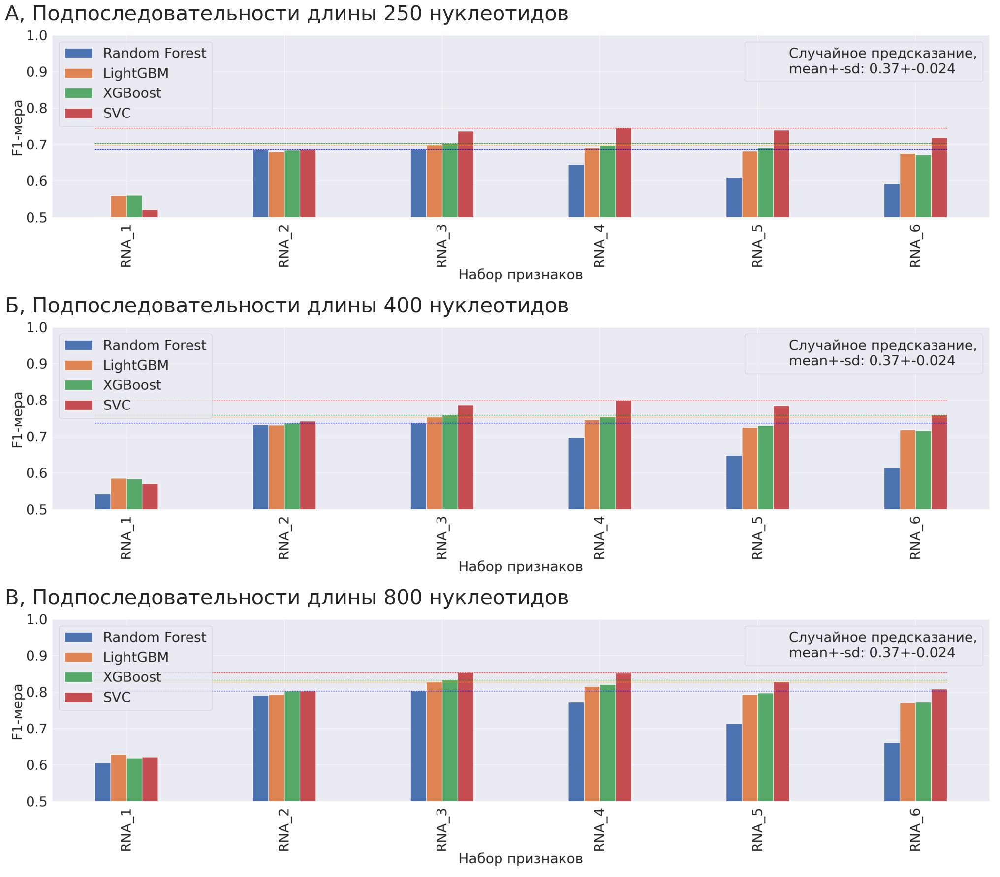

In [25]:
tmp_path = '/home/parazit/ml_virus_host/v2.0/figs/make_1_pic/'
fig = plt.figure(figsize=(26, 18))
  
rows = 3
columns = 1

n_250 = cv2.imread(tmp_path+'clfs_250_ crossing_weighted avg_f1-score.png')
n_250 = cv2.cvtColor(n_250, cv2.COLOR_BGR2RGB)

n_400 = cv2.imread(tmp_path+'clfs_400_ crossing_weighted avg_f1-score.png')
n_400 = cv2.cvtColor(n_400, cv2.COLOR_BGR2RGB)

n_800 = cv2.imread(tmp_path+'clfs_800_ crossing_weighted avg_f1-score.png')
n_800 = cv2.cvtColor(n_800, cv2.COLOR_BGR2RGB)

fig.add_subplot(rows, columns, 1)
plt.imshow(n_250)
plt.axis('off')
plt.title("А, Подпоследовательности длины 250 нуклеотидов", fontsize = 30, loc='left')
  

fig.add_subplot(rows, columns, 2)
plt.imshow(n_400)
plt.axis('off')
plt.title("Б, Подпоследовательности длины 400 нуклеотидов", fontsize = 30, loc='left')

fig.add_subplot(rows, columns, 3)
plt.imshow(n_800)
plt.axis('off')
plt.title("В, Подпоследовательности длины 800 нуклеотидов", fontsize = 30, loc='left')

fig.tight_layout()
plt.savefig(tmp_path+'clfs_crossing_f1-score_ranged'+'.png', dpi=fig.dpi)
plt.show()

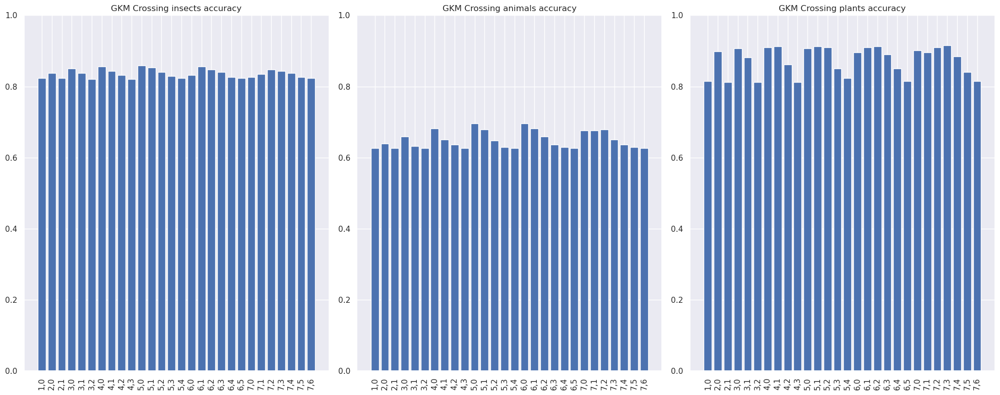

In [118]:
fig, axis = plt.subplots(1, 3, figsize=(20, 8))
names, s_names = ['insects', 'animals', 'plants'], ['i', 'm', 'p']

for class_k in s_names:
    ind = s_names.index(class_k)
    acc_dict = pickle.load(open(PATH_FASTSK_REPORTS + 'crossing/it0/gkm_crossing_acc_dict_' + class_k + '_it0.pkl', 'rb'))

    

    axis[ind].bar(range(len(acc_dict.keys())), acc_dict.values(), align='center')
    axis[ind].set_title('GKM Crossing ' + names[ind] + ' accuracy')
    plt.sca(axis[ind])
    plt.xticks(range(len(acc_dict.keys())), list(acc_dict.keys()), rotation=90)
    plt.ylim(0, 1)

fig.tight_layout()
plt.show()

In [12]:


proba_dicts_m0 = []
for class_k in ['p', 'm', 'i']:
    proba_dicts_m0.append(pickle.load(open(PATH_FASTSK_REPORTS + 'crossing/it0/gkm_crossing_probs_dict_' + class_k + '_it0.pkl', 'rb')))
    
all_accs_m0 = dict()

for key in proba_dicts_m0[0].keys():
    y_proba = np.zeros(shape=proba_dicts_m0[0]['2,1'].shape)

    for i in range(3):
        y_proba = np.vstack((y_proba, proba_dicts_m0[i][key]))
    
    y_proba = y_proba[1:]
    y_proba = (y_proba/y_proba.sum(axis=0))
    y_pred_all = np.argmax(y_proba, axis=0)
    all_accs_m0[key] = accuracy_score(y_int[test_indices_crossing['i']], y_pred_all)    

all_accs = pickle.load(open(PATH_REPORTS + 'crossing/it0/clfs_4methods_sole_crossing.pkl', 'rb'))
svm_acc = [x[3]['accuracy'] for x in all_accs.values()][:7]
    

bar_width = 0.35

fig, axis = plt.subplots(figsize=(8, 6))
svm_norm = axis.bar(range(len(svm_acc)), svm_acc, bar_width,
                label="Normal SVC")

tmp = [0]
keys_tmp = ['2,1', '3,1', '4,1', '5,2', '6,2', '7,3']
tmp.extend([all_accs_m0[x] for x in keys_tmp])

svm_gkm = axis.bar([x+bar_width for x in list(range(len(svm_acc)))], tmp,
                 bar_width, label="GKM SVC (m=diff)")

plt.sca(axis)
plt.xticks(range(len(svm_acc)), list(all_accs.keys())[:7], rotation=90)
axis.legend()

axis.set_xlabel('Features sets (uncrossing)')
axis.set_ylabel('Accuracy')
axis.set_title('SVC and GKM-SVC, comparison')

plt.ylim(0, 1)

FileNotFoundError: [Errno 2] No such file or directory: '/home/parazit/ml_virus_host/v2.0/Reports/crossing/it0/clfs_4methods_sole_crossing.pkl'

In [51]:
test_indices_crossing

{'i': [9,
  15,
  16,
  19,
  32,
  38,
  44,
  61,
  65,
  66,
  67,
  68,
  71,
  78,
  80,
  82,
  84,
  87,
  88,
  92,
  103,
  111,
  116,
  120,
  121,
  122,
  130,
  131,
  136,
  137,
  139,
  145,
  146,
  148,
  149,
  151,
  152,
  157,
  162,
  165,
  173,
  180,
  182,
  184,
  191,
  192,
  194,
  197,
  209,
  210,
  211,
  215,
  220,
  227,
  228,
  232,
  234,
  235,
  237,
  247,
  253,
  254,
  258,
  263,
  266,
  267,
  268,
  272,
  282,
  283,
  289,
  301,
  305,
  311,
  312,
  315,
  320,
  323,
  324,
  325,
  330,
  331,
  342,
  344,
  346,
  347,
  349,
  352,
  353,
  356,
  360,
  361,
  362,
  370,
  373,
  375,
  376,
  380,
  381,
  383,
  388,
  392,
  393,
  397,
  402,
  403,
  404,
  405,
  412,
  419,
  426,
  431,
  436,
  437,
  439,
  441,
  444,
  446,
  447,
  448,
  450,
  457,
  458,
  462,
  465,
  466,
  469,
  471,
  472,
  478,
  480,
  481,
  495,
  499,
  509,
  515,
  517,
  518,
  525,
  527,
  530,
  532,
  535,
  536,
  538,
 

In [99]:
train_indices_crossing

{'i': [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  10,
  11,
  12,
  13,
  14,
  17,
  18,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  33,
  34,
  35,
  36,
  37,
  39,
  40,
  41,
  42,
  43,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  62,
  63,
  64,
  69,
  70,
  72,
  73,
  74,
  75,
  76,
  77,
  79,
  81,
  83,
  85,
  86,
  89,
  90,
  91,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  112,
  113,
  114,
  115,
  117,
  118,
  119,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  132,
  133,
  134,
  135,
  138,
  140,
  141,
  142,
  143,
  144,
  147,
  150,
  153,
  154,
  155,
  156,
  158,
  159,
  160,
  161,
  163,
  164,
  166,
  167,
  168,
  169,
  170,
  171,
  172,
  174,
  175,
  176,
  177,
  178,
  179,
  181,
  183,
  185,
  186,
  187,
  188,
  189,
  190,
  193,
  195,
  196,
  198,
  199,
  200,
  201,
  202,

In [54]:
len(meta_df['virus family'].unique())

43

In [55]:
tmp = Counter(meta_df['host'])
print('Mammalia ' +str(round(tmp['Mammalia']/len(meta_df), 1)*100)+'%')
print('Insecta ' +str(round(tmp['Insecta']/len(meta_df), 2)*100)+'%')
print('Viridiplantae ' +str(round(tmp['Viridiplantae']/len(meta_df), 2)*100)+'%')
print('Total virus families '+str(len(meta_df['virus family'].unique())))
print('Total sequences ' + str(len(meta_df)))

Mammalia 50.0%
Insecta 26.0%
Viridiplantae 25.0%
Total virus families 43
Total sequences 1390


In [56]:
len('ARNDCEQGHILKMFPSTWYV')

20

In [61]:
Counter(meta_df[meta_df['virus family'] == 'Rhabdoviridae'].host)

Counter({'Viridiplantae': 32, 'Insecta': 73, 'Mammalia': 49})

In [62]:
len(meta_df[meta_df['virus family'] == 'Rhabdoviridae'])

154

In [65]:
4900/154


31.818181818181817

# Лучшие признаки

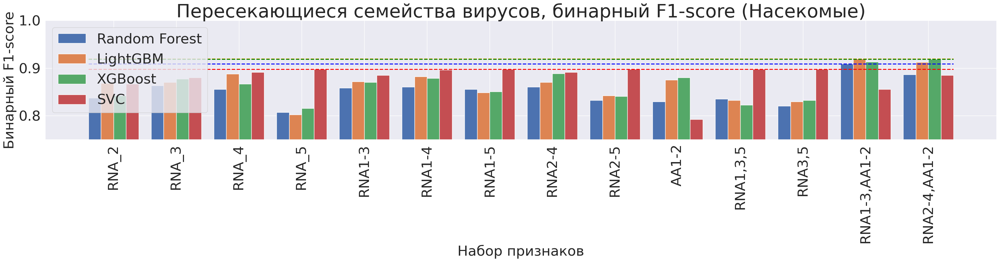

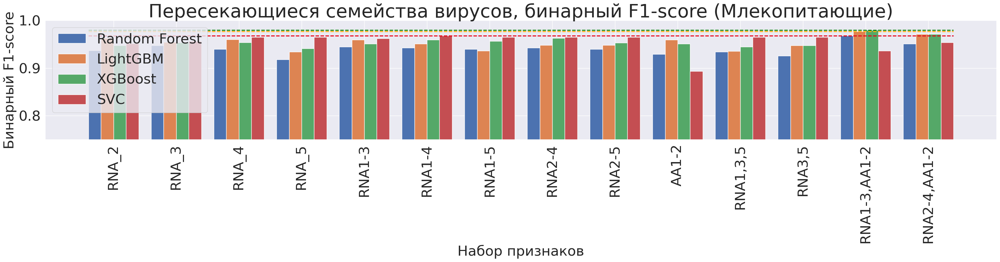

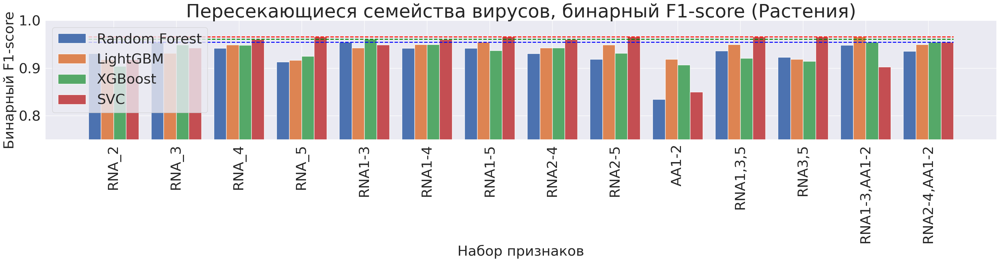

               Random Forest  LightGBM  XGBoost   SVC
Insecta                 0.91      0.92     0.92  0.90
Mammalia                0.97      0.98     0.98  0.97
Viridiplantae           0.95      0.97     0.96  0.97
              Random Forest      LightGBM       XGBoost     SVC
Insecta        RNA1-3,AA1-2  RNA1-3,AA1-2  RNA2-4,AA1-2   RNA_5
Mammalia       RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-3,AA1-2  RNA1-4
Viridiplantae         RNA_3  RNA1-3,AA1-2        RNA1-3   RNA_5


In [54]:
bar_width = 0.2
metrics = ['accuracy', 'weighted avg', 'macro avg']
metric_rus = ['точность', 'взвешенный F1-score', 'макро усреднённый F1-score']

with open(PATH_REPORTS + 'best/full/crossing/clfs_4methods_all__crossing_best.pkl', 'rb') as f1, \
    open(PATH_REPORTS + 'best/full/crossing/clfs_4methods_sole__crossing_best.pkl', 'rb') as f2:

    
    sets_names = ['crossing']
    pic_headers = ['Пересекающиеся семейства вирусов']
    f_lst = [f1, f2]
   
    for set_index in range(len(sets_names)):
        
        pair_lst = list()
        pair_lst.append(pickle.load(f_lst[set_index*2]))
        pair_lst.append(pickle.load(f_lst[set_index*2+1]))
        all_accs = {**pair_lst[1], **pair_lst[0]}

        models = ['rf', 'lgbm', 'xgb', 'svc']
        hosts = ['Insecta', 'Mammalia', 'Viridiplantae']
        hosts_rus = ['Насекомые', 'Млекопитающие', 'Растения']
        
        max_values = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])
        max_features = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])


        for class_k in hosts:
            
            fig, axis = plt.subplots(figsize=(30, 8))

            rf_values = [x[0][class_k]['f1-score'] for x in all_accs.values()]
            lgbm_values = [x[1][class_k]['f1-score'] for x in all_accs.values()]
            xgb_values = [x[2][class_k]['f1-score'] for x in all_accs.values()]
            svm_values = [x[3][class_k]['f1-score'] for x in all_accs.values()]

            accs = [rf_values, lgbm_values, xgb_values, svm_values]
            
            max_values_row = {'Random Forest':round(max(rf_values), 2), \
                              'LightGBM':round(max(lgbm_values), 2), \
                              'XGBoost':round(max(xgb_values), 2), \
                              'SVC':round(max(svm_values), 2)}
            max_values = max_values.append(max_values_row, ignore_index=True)
            
            max_features_row = {'Random Forest':list(all_accs.keys())[rf_values.index(max(rf_values))], \
                               'LightGBM':list(all_accs.keys())[lgbm_values.index(max(lgbm_values))], \
                               'XGBoost':list(all_accs.keys())[xgb_values.index(max(xgb_values))], \
                               'SVC':list(all_accs.keys())[svm_values.index(max(svm_values))]}
            max_features = max_features.append(max_features_row, ignore_index=True)
            
            #pd.concat(max_values_row, max_values).reset_index(drop=True)
            
            axis.bar([x for x in list(range(len(all_accs.keys())))], rf_values, bar_width, align='center', label="Random Forest")
            axis.bar([x+bar_width for x in list(range(len(all_accs.keys())))], lgbm_values, bar_width, align='center', label='LightGBM')
            axis.bar([x+bar_width*2 for x in list(range(len(all_accs.keys())))], xgb_values, bar_width, align='center', label='XGBoost')
            axis.bar([x+bar_width*3 for x in list(range(len(all_accs.keys())))], svm_values, bar_width, align='center', label='SVC')
            
            plt.hlines(y=max(rf_values), xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='blue', linestyles='--', lw=2)
            plt.hlines(y=max(lgbm_values), xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='orange', linestyles='--', lw=2)
            plt.hlines(y=max(xgb_values), xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='green', linestyles='--', lw=2)
            plt.hlines(y=max(svm_values), xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='red', linestyles='--', lw=2)
        
            
            
            
            axis.set_title(pic_headers[set_index]+', бинарный F1-score ('+hosts_rus[hosts.index(class_k)]+')', fontsize=40)
            #axis.legend(fontsize=20)
            
            axis.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
            
            plt.sca(axis)
            plt.xticks([x+bar_width*1.5 for x in list(range(len(all_accs.keys())))], list(all_accs.keys()), fontsize=30, rotation=90)
            axis.tick_params('y', labelsize=30)
            plt.ylim(0.75, 1)
            plt.ylabel('Бинарный F1-score', fontsize=30)
            plt.xlabel('Набор признаков', fontsize=30)
            fig.tight_layout()
            axis.legend(fontsize=30, loc="upper left")
            
            plt.savefig(PATH_FIGS+'best/clfs_'+sets_names[set_index]+'_f1-score_'+class_k+'.svg')
            plt.savefig(PATH_FIGS+'best/clfs_'+sets_names[set_index]+'_f1-score_'+class_k+'.png')
            plt.show()
            
        max_features.index = hosts
        max_values.index = hosts
        print(max_values)
        print(max_features)

,Median,Mean,SD
accuracy,0.368,0.368732,0.023995
weighted f1-score,0.368,0.368432,0.024359
macro average f1-score,0.334,0.333090,0.025853


# Предсказание хозяев коротких последовательностей (обучение по полным)

0.369337 0 accuracy


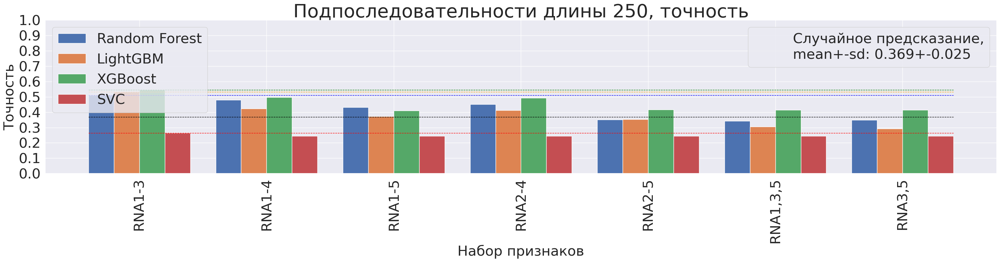

0.332105 1 macro avg


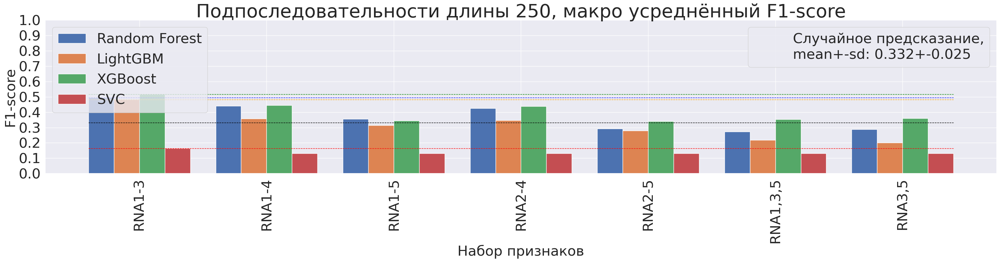

0.37006 2 weighted avg


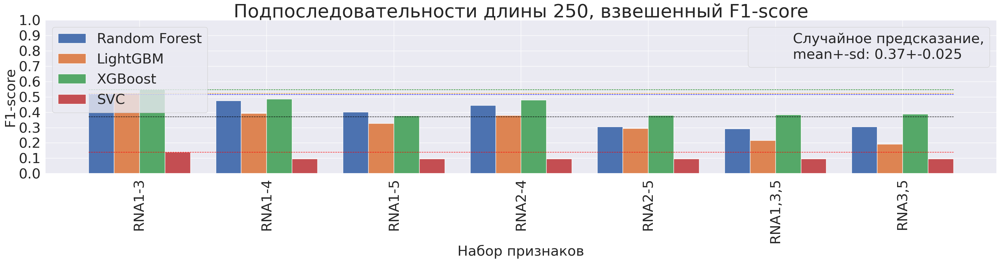

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.51      0.53     0.55  0.27
macro avg              0.49      0.48     0.52  0.16
weighted avg           0.52      0.52     0.55  0.14
             Random Forest LightGBM XGBoost     SVC
accuracy            RNA1-3   RNA1-3  RNA1-3  RNA1-3
macro avg           RNA1-3   RNA1-3  RNA1-3  RNA1-3
weighted avg        RNA1-3   RNA1-3  RNA1-3  RNA1-3
0.369337 0 accuracy


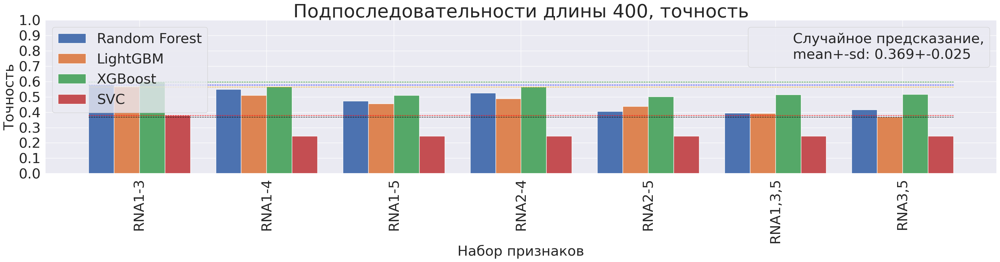

0.332105 1 macro avg


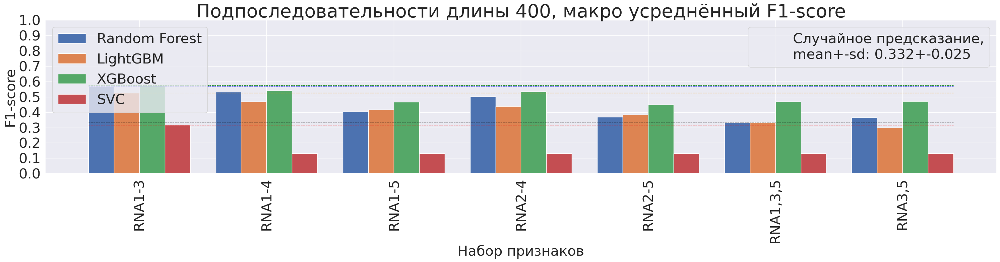

0.37006 2 weighted avg


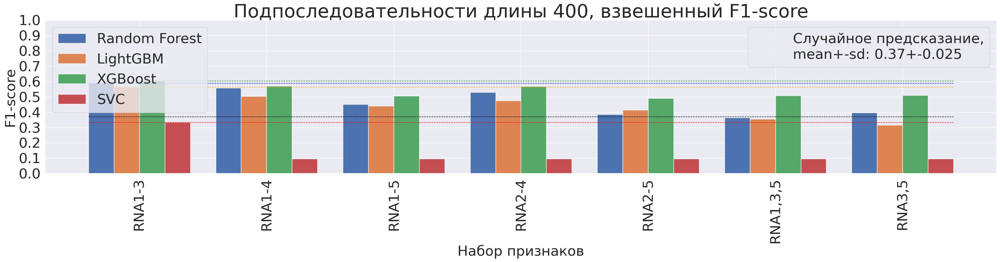

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.58      0.57     0.60  0.38
macro avg              0.57      0.53     0.58  0.32
weighted avg           0.59      0.56     0.61  0.33
             Random Forest LightGBM XGBoost     SVC
accuracy            RNA1-3   RNA1-3  RNA1-3  RNA1-3
macro avg           RNA1-3   RNA1-3  RNA1-3  RNA1-3
weighted avg        RNA1-3   RNA1-3  RNA1-3  RNA1-3
0.369337 0 accuracy


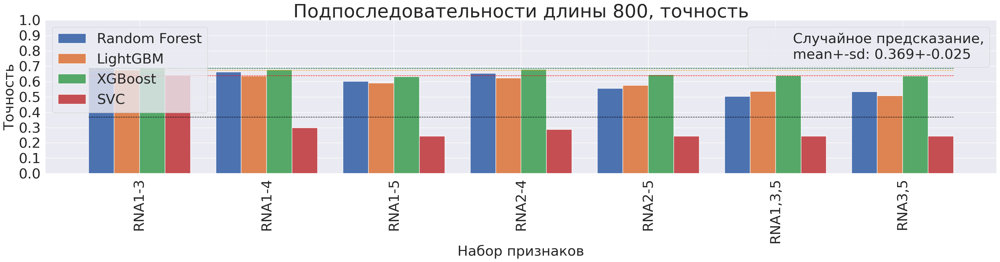

0.332105 1 macro avg


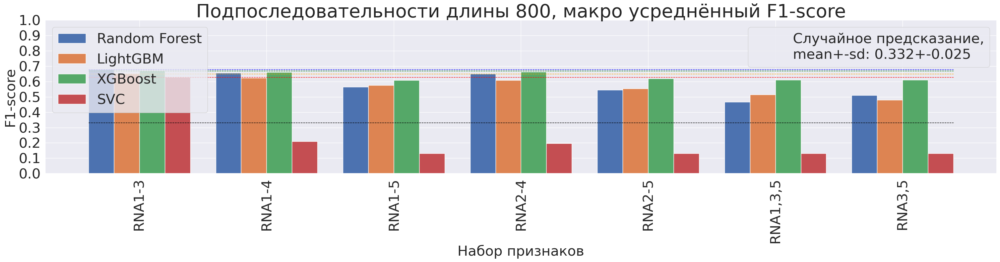

0.37006 2 weighted avg


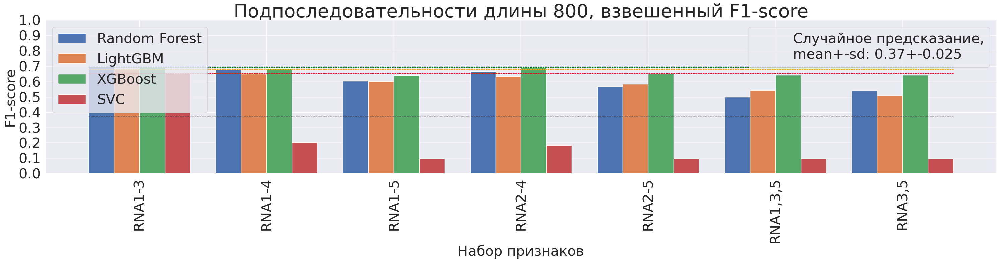

              Random Forest  LightGBM  XGBoost   SVC
accuracy               0.69      0.67     0.69  0.64
macro avg              0.68      0.65     0.67  0.63
weighted avg           0.70      0.68     0.69  0.65
             Random Forest LightGBM XGBoost     SVC
accuracy            RNA1-3   RNA1-3  RNA1-3  RNA1-3
macro avg           RNA1-3   RNA1-3  RNA1-3  RNA1-3
weighted avg        RNA1-3   RNA1-3  RNA1-3  RNA1-3


In [69]:
bar_width = 0.2
metrics = ['accuracy', 'macro avg', 'weighted avg']
metric_rus = ['точность', 'макро усреднённый F1-score', 'взвешенный F1-score']



with open(PATH_REPORTS_FULL2RANGED + 'clfs_4methods_full->ranged.pkl', 'rb') as f1:
    all_accs = pickle.load(f1)

    for ranged_seq_size in ['250', '400', '800']:
        max_values = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])
        max_features = pd.DataFrame(columns=['Random Forest', 'LightGBM', 'XGBoost', 'SVC'])
        
        for met in metrics:    
            fig, axis = plt.subplots(figsize=(30, 8))
            
            if met == 'accuracy':
                y_name = 'Точность'
                rf_values = [x[ranged_seq_size][0][met] for x in all_accs.values()]
                lgbm_values = [x[ranged_seq_size][1][met] for x in all_accs.values()]
                xgb_values = [x[ranged_seq_size][2][met] for x in all_accs.values()]
                svm_values = [x[ranged_seq_size][3][met] for x in all_accs.values()]
            else:
                y_name = 'F1-score'
                rf_values = [x[ranged_seq_size][0][met]['f1-score'] for x in all_accs.values()]
                lgbm_values = [x[ranged_seq_size][1][met]['f1-score'] for x in all_accs.values()]
                xgb_values = [x[ranged_seq_size][2][met]['f1-score'] for x in all_accs.values()]
                svm_values = [x[ranged_seq_size][3][met]['f1-score'] for x in all_accs.values()]
            
            max_values_row = {'Random Forest':round(max(rf_values), 2), \
                              'LightGBM':round(max(lgbm_values), 2), \
                              'XGBoost':round(max(xgb_values), 2), \
                              'SVC':round(max(svm_values), 2)}
            max_values = max_values.append(max_values_row, ignore_index=True)
            
            max_features_row = {'Random Forest':list(all_accs.keys())[rf_values.index(max(rf_values))], \
                               'LightGBM':list(all_accs.keys())[lgbm_values.index(max(lgbm_values))], \
                               'XGBoost':list(all_accs.keys())[xgb_values.index(max(xgb_values))], \
                               'SVC':list(all_accs.keys())[svm_values.index(max(svm_values))]}
            max_features = max_features.append(max_features_row, ignore_index=True)
            
            
            accs = [rf_values, lgbm_values, xgb_values, svm_values]

            # Столбцы с качеством предсказания различными алгоритмами ML
            axis.bar([x for x in list(range(len(all_accs.keys())))], rf_values, bar_width, align='center', label="Random Forest")
            axis.bar([x+bar_width for x in list(range(len(all_accs.keys())))], lgbm_values, bar_width, align='center', label='LightGBM')
            axis.bar([x+bar_width*2 for x in list(range(len(all_accs.keys())))], xgb_values, bar_width, align='center', label='XGBoost')
            axis.bar([x+bar_width*3 for x in list(range(len(all_accs.keys())))], svm_values, bar_width, align='center', label='SVC')

            # Максимальные значения качества предсказания
            plt.hlines(y=max(rf_values), xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='blue', linestyles='--', lw=1)
            plt.hlines(y=max(lgbm_values), xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='orange', linestyles='--', lw=1)
            plt.hlines(y=max(xgb_values), xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='green', linestyles='--', lw=1)
            plt.hlines(y=max(svm_values), xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='red', linestyles='--', lw=1)
            
            plt.hlines(y=random_pred_values['Mean'][metrics.index(met)], xmin=-0.1, xmax=len(all_accs.keys())-0.3, colors='black', linestyles='--', lw=1)
            
            # Среднее +- стандартное отклонение
            print(random_pred_values['Mean'][metrics.index(met)], metrics.index(met), met)
            leg1_label= axis.plot([], [], ' ')
            leg1 = Legend(axis, leg1_label, ["Случайное предсказание,\nmean+-sd: " + str(round(random_pred_values['Mean'][metrics.index(met)], 3))+'+-'+str(round(random_pred_values['SD'][metrics.index(met)], 3))], loc='upper right', fontsize=30)
            axis.add_artist(leg1)
            
            axis.set_title('Подпоследовательности длины '+ranged_seq_size+', '+metric_rus[metrics.index(met)], fontsize=40)
            axis.legend(fontsize=30, loc='upper left')
            #model = models[i]
            #axis[i].bar(range(len(all_accs.keys())), accs[i], align='center')
            #axis[i].set_title(model+' '+sets_names[set_index]+' accuracy')
            plt.sca(axis)
            plt.xticks([x+bar_width*1.5 for x in list(range(len(all_accs.keys())))], list(all_accs.keys()), fontsize=30, rotation=90)
            axis.yaxis.set_major_locator(ticker.MultipleLocator(0.1))
            plt.ylim(0, 1)
            axis.tick_params('y', labelsize=30)
            

            plt.ylabel(y_name, fontsize=30)
            plt.xlabel('Набор признаков', fontsize=30)

            fig.tight_layout()
            
            plt.savefig(PATH_FIGS+'full2ranged/clfs_'+ranged_seq_size+'_'+name.split(' ')[2][:-1]+'_'+name.split(',')[1]+'_'+met+'_'+extra_word+'.svg')            
            plt.savefig(PATH_FIGS+'full2ranged/clfs_'+ranged_seq_size+'_'+name.split(' ')[2][:-1]+'_'+name.split(',')[1]+'_'+met+'_'+extra_word+'.png')
            plt.show()
            
        max_features.index = metrics
        max_values.index = metrics
        print(max_values)
        print(max_features)


In [68]:
random_pred_values

,Median,Mean,SD
accuracy,0.368,0.369337,0.024504
macro average f1-score,0.332,0.332105,0.024717
weighted f1-score,0.368,0.370060,0.025049
